In [1]:
import tensorflow as tf

In [31]:
help(tf.keras.preprocessing)

Help on package keras.api._v2.keras.preprocessing in keras.api._v2.keras:

NAME
    keras.api._v2.keras.preprocessing - Utilities to preprocess data before training.

DESCRIPTION
    Deprecated: `tf.keras.preprocessing` APIs do not operate on tensors and are
    not recommended for new code. Prefer loading data with either
    `tf.keras.utils.text_dataset_from_directory` or
    `tf.keras.utils.image_dataset_from_directory`, and then transforming the output
    `tf.data.Dataset` with preprocessing layers. These approaches will offer
    better performance and intergration with the broader Tensorflow ecosystem. For
    more information, see the tutorials for [loading text](
    https://www.tensorflow.org/tutorials/load_data/text), [loading images](
    https://www.tensorflow.org/tutorials/load_data/images), and [augmenting images](
    https://www.tensorflow.org/tutorials/images/data_augmentation), as well as the
    [preprocessing layer guide](
    https://www.tensorflow.org/guide/keras

In [34]:
help(tf.keras.utils.image_dataset_from_directory)

Help on function image_dataset_from_directory in module keras.utils.image_dataset:

image_dataset_from_directory(directory, labels='inferred', label_mode='int', class_names=None, color_mode='rgb', batch_size=32, image_size=(256, 256), shuffle=True, seed=None, validation_split=None, subset=None, interpolation='bilinear', follow_links=False, crop_to_aspect_ratio=False, **kwargs)
    Generates a `tf.data.Dataset` from image files in a directory.
    
    If your directory structure is:
    
    ```
    main_directory/
    ...class_a/
    ......a_image_1.jpg
    ......a_image_2.jpg
    ...class_b/
    ......b_image_1.jpg
    ......b_image_2.jpg
    ```
    
    Then calling `image_dataset_from_directory(main_directory,
    labels='inferred')` will return a `tf.data.Dataset` that yields batches of
    images from the subdirectories `class_a` and `class_b`, together with labels
    0 and 1 (0 corresponding to `class_a` and 1 corresponding to `class_b`).
    
    Supported image formats: jpeg

In [2]:
training_data = tf.keras.utils.image_dataset_from_directory("G:\MSc project\Dataset 3\Training",
                                                                            color_mode = 'rgb',
                                                                            validation_split = 0.20, subset = "training",seed= 1 )

validation_data = tf.keras.utils.image_dataset_from_directory("G:\MSc project\Dataset 3\Training",
                                                                            color_mode = 'rgb',
                                                                            validation_split = 0.20, subset = "validation",seed= 1 )



Found 5712 files belonging to 4 classes.
Using 4570 files for training.
Found 5712 files belonging to 4 classes.
Using 1142 files for validation.


(32, 256, 256, 3)
tf.Tensor(0, shape=(), dtype=int32)
(32, 256, 256, 3)
tf.Tensor(0, shape=(), dtype=int32)
(32, 256, 256, 3)
tf.Tensor(1, shape=(), dtype=int32)
(32, 256, 256, 3)
tf.Tensor(0, shape=(), dtype=int32)
(32, 256, 256, 3)
tf.Tensor(3, shape=(), dtype=int32)
(32, 256, 256, 3)
tf.Tensor(1, shape=(), dtype=int32)
(32, 256, 256, 3)
tf.Tensor(0, shape=(), dtype=int32)
(32, 256, 256, 3)
tf.Tensor(1, shape=(), dtype=int32)
(32, 256, 256, 3)
tf.Tensor(1, shape=(), dtype=int32)


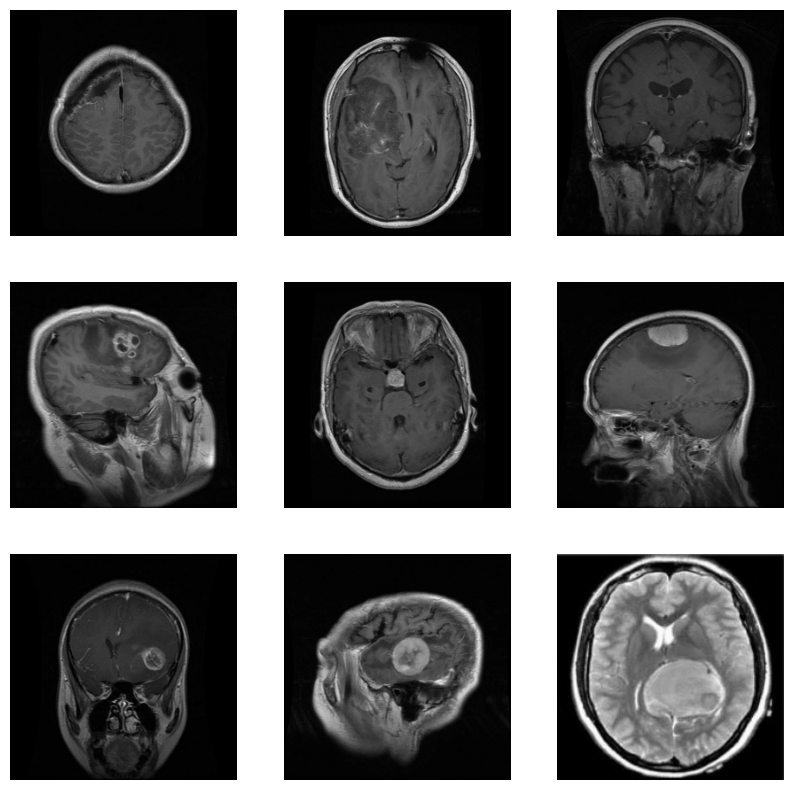

In [3]:
import matplotlib.pyplot as plt
plt.figure(figsize=(10, 10))
for images, _ in training_data.take(1):
        for i in range(9):
            augmented_images = images
            print(images.shape)
            ax = plt.subplot(3, 3, i + 1)
            plt.imshow(augmented_images[i].numpy().astype("uint8"), cmap = 'gray')
            print(_[i])
            plt.axis("off")

In [7]:
from tensorflow.keras import layers
from tensorflow.keras import Model

# Architectures 
### 1) Data augmentation in input layers.
### 2) pretrained architectures
### 3) evaluation

### Architectures:
#### 1) XCeption
#### 2) VGG19
#### 3) ResNet152V2
#### 4) InceptionResNetV2	
#### 5) MobileNetV2
#### 6) DenseNet201
#### 7) NASNetLarge
#### 8) EfficientNetV2S
#### 9) My architecture test.

## Data preperation

In [3]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
train_g = ImageDataGenerator( rescale=1./255,rotation_range= 10, 
                             validation_split = 0.15,     
                             horizontal_flip=True, vertical_flip = True)
train_gen = train_g.flow_from_directory("G:\MSc project\Dataset 3\Training",
                                       target_size = (150,150),
                                        color_mode = 'rgb',
                                       class_mode = 'sparse',
                                        subset = "training",
                            batch_size= 32
                                       )

valid_gen = train_g.flow_from_directory("G:\MSc project\Dataset 3\Training",
                                       target_size = (150,150),
                                        color_mode = 'rgb',
                                       class_mode = 'sparse',
                                        subset = "validation",
                            batch_size= 32
                                       )
Test_g = ImageDataGenerator( rescale=1./255)
Test_gen = Test_g.flow_from_directory("G:\MSc project\Dataset 3\Testing",
                                       target_size = (150,150),
                                        color_mode = 'rgb',
                                       class_mode = 'sparse',
                            batch_size= 32
                                       )

Found 4857 images belonging to 4 classes.
Found 855 images belonging to 4 classes.
Found 1311 images belonging to 4 classes.


# NASNET MODEL

import tensorflow
plt.figure(figsize= (100,100))
tensorflow.keras.utils.plot_model(basemodel, to_file='G:\model.png')

In [156]:
tensorflow.keras.utils.plot_model(basemodel)

In [4]:
basemodel = tf.keras.applications.NASNetLarge(
    input_shape  = (150,150,3),
    include_top=False,
    weights='imagenet',
    classes=4)

for layer in basemodel.layers[:-44]:
    layer.trainable = False
    

In [364]:
for layer in basemodel.layers[:-11]:
    print(layer.name)

input_84
stem_conv1
stem_bn1
activation_3640
reduction_conv_1_stem_1
reduction_bn_1_stem_1
activation_3641
activation_3643
separable_conv_1_pad_reduction_left1_stem_1
separable_conv_1_pad_reduction_right1_stem_1
separable_conv_1_reduction_left1_stem_1
separable_conv_1_reduction_right1_stem_1
separable_conv_1_bn_reduction_left1_stem_1
separable_conv_1_bn_reduction_right1_stem_1
activation_3642
activation_3644
separable_conv_2_reduction_left1_stem_1
separable_conv_2_reduction_right1_stem_1
activation_3645
separable_conv_2_bn_reduction_left1_stem_1
separable_conv_2_bn_reduction_right1_stem_1
separable_conv_1_pad_reduction_right2_stem_1
activation_3647
reduction_add_1_stem_1
separable_conv_1_reduction_right2_stem_1
separable_conv_1_pad_reduction_right3_stem_1
activation_3649
separable_conv_1_bn_reduction_right2_stem_1
separable_conv_1_reduction_right3_stem_1
separable_conv_1_reduction_left4_stem_1
activation_3646
separable_conv_1_bn_reduction_right3_stem_1
separable_conv_1_bn_reduction_lef

In [365]:
basemodel.summary()

Model: "NASNet"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_84 (InputLayer)          [(None, 150, 150, 3  0           []                               
                                )]                                                                
                                                                                                  
 stem_conv1 (Conv2D)            (None, 74, 74, 96)   2592        ['input_84[0][0]']               
                                                                                                  
 stem_bn1 (BatchNormalization)  (None, 74, 74, 96)   384         ['stem_conv1[0][0]']             
                                                                                                  
 activation_3640 (Activation)   (None, 74, 74, 96)   0           ['stem_bn1[0][0]']          

 right2_stem_1 (BatchNormalizat                                  t2_stem_1[0][0]']                
 ion)                                                                                             
                                                                                                  
 separable_conv_1_reduction_rig  (None, 37, 37, 42)  6432        ['separable_conv_1_pad_reduction_
 ht3_stem_1 (SeparableConv2D)                                    right3_stem_1[0][0]']            
                                                                                                  
 separable_conv_1_reduction_lef  (None, 37, 37, 42)  2142        ['activation_3649[0][0]']        
 t4_stem_1 (SeparableConv2D)                                                                      
                                                                                                  
 activation_3646 (Activation)   (None, 37, 37, 42)   0           ['separable_conv_1_bn_reduction_r
          

 cropping2d_56 (Cropping2D)     (None, 74, 74, 96)   0           ['zero_padding2d_56[0][0]']      
                                                                                                  
 reduction_concat_stem_1 (Conca  (None, 37, 37, 168)  0          ['reduction_add_2_stem_1[0][0]', 
 tenate)                                                          'reduction_add3_stem_1[0][0]',  
                                                                  'add_56[0][0]',                 
                                                                  'reduction_add4_stem_1[0][0]']  
                                                                                                  
 adjust_avg_pool_1_stem_2 (Aver  (None, 37, 37, 96)  0           ['adjust_relu_1_stem_2[0][0]']   
 agePooling2D)                                                                                    
                                                                                                  
 adjust_av

                                                                                                  
 reduction_add_1_stem_2 (Add)   (None, 19, 19, 84)   0           ['separable_conv_2_bn_reduction_l
                                                                 eft1_stem_2[0][0]',              
                                                                  'separable_conv_2_bn_reduction_r
                                                                 ight1_stem_2[0][0]']             
                                                                                                  
 separable_conv_1_reduction_rig  (None, 19, 19, 84)  11172       ['separable_conv_1_pad_reduction_
 ht2_stem_2 (SeparableConv2D)                                    right2_stem_2[0][0]']            
                                                                                                  
 separable_conv_1_pad_reduction  (None, 41, 41, 84)  0           ['activation_3658[0][0]']        
 _right3_s

 zero_padding2d_57 (ZeroPadding  (None, 38, 38, 168)  0          ['adjust_relu_1_0[0][0]']        
 2D)                                                                                              
                                                                                                  
 reduction_add3_stem_2 (Add)    (None, 19, 19, 84)   0           ['reduction_left3_stem_2[0][0]', 
                                                                  'separable_conv_2_bn_reduction_r
                                                                 ight3_stem_2[0][0]']             
                                                                                                  
 add_57 (Add)                   (None, 19, 19, 84)   0           ['reduction_add_2_stem_2[0][0]', 
                                                                  'reduction_left4_stem_2[0][0]'] 
                                                                                                  
 reduction

                                                                                                  
 activation_3664 (Activation)   (None, 19, 19, 168)  0           ['separable_conv_1_bn_normal_left
                                                                 1_0[0][0]']                      
                                                                                                  
 activation_3666 (Activation)   (None, 19, 19, 168)  0           ['separable_conv_1_bn_normal_righ
                                                                 t1_0[0][0]']                     
                                                                                                  
 activation_3668 (Activation)   (None, 19, 19, 168)  0           ['separable_conv_1_bn_normal_left
                                                                 2_0[0][0]']                      
                                                                                                  
 activatio

                                                                                                  
 activation_3674 (Activation)   (None, 19, 19, 1008  0           ['normal_concat_0[0][0]']        
                                )                                                                 
                                                                                                  
 adjust_conv_projection_1 (Conv  (None, 19, 19, 168)  56448      ['activation_3673[0][0]']        
 2D)                                                                                              
                                                                                                  
 normal_conv_1_1 (Conv2D)       (None, 19, 19, 168)  169344      ['activation_3674[0][0]']        
                                                                                                  
 adjust_bn_1 (BatchNormalizatio  (None, 19, 19, 168)  672        ['adjust_conv_projection_1[0][0]'
 n)       

 1 (SeparableConv2D)                                                                              
                                                                                                  
 separable_conv_2_bn_normal_lef  (None, 19, 19, 168)  672        ['separable_conv_2_normal_left1_1
 t1_1 (BatchNormalization)                                       [0][0]']                         
                                                                                                  
 separable_conv_2_bn_normal_rig  (None, 19, 19, 168)  672        ['separable_conv_2_normal_right1_
 ht1_1 (BatchNormalization)                                      1[0][0]']                        
                                                                                                  
 separable_conv_2_bn_normal_lef  (None, 19, 19, 168)  672        ['separable_conv_2_normal_left2_1
 t2_1 (BatchNormalization)                                       [0][0]']                         
          

 separable_conv_1_normal_right1  (None, 19, 19, 168)  29736      ['activation_3689[0][0]']        
 _2 (SeparableConv2D)                                                                             
                                                                                                  
 separable_conv_1_normal_left2_  (None, 19, 19, 168)  32424      ['activation_3691[0][0]']        
 2 (SeparableConv2D)                                                                              
                                                                                                  
 separable_conv_1_normal_right2  (None, 19, 19, 168)  29736      ['activation_3693[0][0]']        
 _2 (SeparableConv2D)                                                                             
                                                                                                  
 separable_conv_1_normal_left5_  (None, 19, 19, 168)  29736      ['activation_3695[0][0]']        
 2 (Separa

                                                                  'separable_conv_2_bn_normal_righ
                                                                 t1_2[0][0]']                     
                                                                                                  
 normal_add_2_2 (Add)           (None, 19, 19, 168)  0           ['separable_conv_2_bn_normal_left
                                                                 2_2[0][0]',                      
                                                                  'separable_conv_2_bn_normal_righ
                                                                 t2_2[0][0]']                     
                                                                                                  
 normal_add_3_2 (Add)           (None, 19, 19, 168)  0           ['normal_left3_2[0][0]',         
                                                                  'adjust_bn_2[0][0]']            
          

                                                                 1_3[0][0]']                      
                                                                                                  
 activation_3702 (Activation)   (None, 19, 19, 168)  0           ['separable_conv_1_bn_normal_righ
                                                                 t1_3[0][0]']                     
                                                                                                  
 activation_3704 (Activation)   (None, 19, 19, 168)  0           ['separable_conv_1_bn_normal_left
                                                                 2_3[0][0]']                      
                                                                                                  
 activation_3706 (Activation)   (None, 19, 19, 168)  0           ['separable_conv_1_bn_normal_righ
                                                                 t2_3[0][0]']                     
          

 activation_3710 (Activation)   (None, 19, 19, 1008  0           ['normal_concat_3[0][0]']        
                                )                                                                 
                                                                                                  
 adjust_conv_projection_4 (Conv  (None, 19, 19, 168)  169344     ['activation_3709[0][0]']        
 2D)                                                                                              
                                                                                                  
 normal_conv_1_4 (Conv2D)       (None, 19, 19, 168)  169344      ['activation_3710[0][0]']        
                                                                                                  
 adjust_bn_4 (BatchNormalizatio  (None, 19, 19, 168)  672        ['adjust_conv_projection_4[0][0]'
 n)                                                              ]                                
          

                                                                                                  
 separable_conv_2_bn_normal_lef  (None, 19, 19, 168)  672        ['separable_conv_2_normal_left1_4
 t1_4 (BatchNormalization)                                       [0][0]']                         
                                                                                                  
 separable_conv_2_bn_normal_rig  (None, 19, 19, 168)  672        ['separable_conv_2_normal_right1_
 ht1_4 (BatchNormalization)                                      4[0][0]']                        
                                                                                                  
 separable_conv_2_bn_normal_lef  (None, 19, 19, 168)  672        ['separable_conv_2_normal_left2_4
 t2_4 (BatchNormalization)                                       [0][0]']                         
                                                                                                  
 separable

 _5 (SeparableConv2D)                                                                             
                                                                                                  
 separable_conv_1_normal_left2_  (None, 19, 19, 168)  32424      ['activation_3727[0][0]']        
 5 (SeparableConv2D)                                                                              
                                                                                                  
 separable_conv_1_normal_right2  (None, 19, 19, 168)  29736      ['activation_3729[0][0]']        
 _5 (SeparableConv2D)                                                                             
                                                                                                  
 separable_conv_1_normal_left5_  (None, 19, 19, 168)  29736      ['activation_3731[0][0]']        
 5 (SeparableConv2D)                                                                              
          

                                                                 t1_5[0][0]']                     
                                                                                                  
 normal_add_2_5 (Add)           (None, 19, 19, 168)  0           ['separable_conv_2_bn_normal_left
                                                                 2_5[0][0]',                      
                                                                  'separable_conv_2_bn_normal_righ
                                                                 t2_5[0][0]']                     
                                                                                                  
 normal_add_3_5 (Add)           (None, 19, 19, 168)  0           ['normal_left3_5[0][0]',         
                                                                  'adjust_bn_5[0][0]']            
                                                                                                  
 normal_ad

 left1_reduce_6 (BatchNormaliza                                  1_reduce_6[0][0]']               
 tion)                                                                                            
                                                                                                  
 separable_conv_2_bn_reduction_  (None, 10, 10, 336)  1344       ['separable_conv_2_reduction_righ
 right1_reduce_6 (BatchNormaliz                                  t1_reduce_6[0][0]']              
 ation)                                                                                           
                                                                                                  
 separable_conv_1_pad_reduction  (None, 25, 25, 336)  0          ['activation_3739[0][0]']        
 _right2_reduce_6 (ZeroPadding2                                                                   
 D)                                                                                               
          

                                                                                                  
 separable_conv_2_bn_reduction_  (None, 10, 10, 336)  1344       ['separable_conv_2_reduction_righ
 right3_reduce_6 (BatchNormaliz                                  t3_reduce_6[0][0]']              
 ation)                                                                                           
                                                                                                  
 reduction_left4_reduce_6 (Aver  (None, 10, 10, 336)  0          ['reduction_add_1_reduce_6[0][0]'
 agePooling2D)                                                   ]                                
                                                                                                  
 separable_conv_2_bn_reduction_  (None, 10, 10, 336)  1344       ['separable_conv_2_reduction_left
 left4_reduce_6 (BatchNormaliza                                  4_reduce_6[0][0]']               
 tion)    

 _7 (SeparableConv2D)                                                                             
                                                                                                  
 separable_conv_1_normal_left5_  (None, 10, 10, 336)  115920     ['activation_3754[0][0]']        
 7 (SeparableConv2D)                                                                              
                                                                                                  
 separable_conv_1_bn_normal_lef  (None, 10, 10, 336)  1344       ['separable_conv_1_normal_left1_7
 t1_7 (BatchNormalization)                                       [0][0]']                         
                                                                                                  
 separable_conv_1_bn_normal_rig  (None, 10, 10, 336)  1344       ['separable_conv_1_normal_right1_
 ht1_7 (BatchNormalization)                                      7[0][0]']                        
          

                                                                                                  
 normal_add_3_7 (Add)           (None, 10, 10, 336)  0           ['normal_left3_7[0][0]',         
                                                                  'adjust_bn_7[0][0]']            
                                                                                                  
 normal_add_4_7 (Add)           (None, 10, 10, 336)  0           ['normal_left4_7[0][0]',         
                                                                  'normal_right4_7[0][0]']        
                                                                                                  
 normal_add_5_7 (Add)           (None, 10, 10, 336)  0           ['separable_conv_2_bn_normal_left
                                                                 5_7[0][0]',                      
                                                                  'normal_bn_1_7[0][0]']          
          

                                                                                                  
 activation_3765 (Activation)   (None, 10, 10, 336)  0           ['separable_conv_1_bn_normal_righ
                                                                 t2_8[0][0]']                     
                                                                                                  
 activation_3767 (Activation)   (None, 10, 10, 336)  0           ['separable_conv_1_bn_normal_left
                                                                 5_8[0][0]']                      
                                                                                                  
 separable_conv_2_normal_left1_  (None, 10, 10, 336)  121296     ['activation_3759[0][0]']        
 8 (SeparableConv2D)                                                                              
                                                                                                  
 separable

                                                                                                  
 adjust_bn_9 (BatchNormalizatio  (None, 10, 10, 336)  1344       ['adjust_conv_projection_9[0][0]'
 n)                                                              ]                                
                                                                                                  
 normal_bn_1_9 (BatchNormalizat  (None, 10, 10, 336)  1344       ['normal_conv_1_9[0][0]']        
 ion)                                                                                             
                                                                                                  
 activation_3770 (Activation)   (None, 10, 10, 336)  0           ['normal_bn_1_9[0][0]']          
                                                                                                  
 activation_3772 (Activation)   (None, 10, 10, 336)  0           ['adjust_bn_9[0][0]']            
          

 separable_conv_2_bn_normal_lef  (None, 10, 10, 336)  1344       ['separable_conv_2_normal_left2_9
 t2_9 (BatchNormalization)                                       [0][0]']                         
                                                                                                  
 separable_conv_2_bn_normal_rig  (None, 10, 10, 336)  1344       ['separable_conv_2_normal_right2_
 ht2_9 (BatchNormalization)                                      9[0][0]']                        
                                                                                                  
 normal_left3_9 (AveragePooling  (None, 10, 10, 336)  0          ['normal_bn_1_9[0][0]']          
 2D)                                                                                              
                                                                                                  
 normal_left4_9 (AveragePooling  (None, 10, 10, 336)  0          ['adjust_bn_9[0][0]']            
 2D)      

                                                                                                  
 separable_conv_1_normal_left5_  (None, 10, 10, 336)  115920     ['activation_3790[0][0]']        
 10 (SeparableConv2D)                                                                             
                                                                                                  
 separable_conv_1_bn_normal_lef  (None, 10, 10, 336)  1344       ['separable_conv_1_normal_left1_1
 t1_10 (BatchNormalization)                                      0[0][0]']                        
                                                                                                  
 separable_conv_1_bn_normal_rig  (None, 10, 10, 336)  1344       ['separable_conv_1_normal_right1_
 ht1_10 (BatchNormalization)                                     10[0][0]']                       
                                                                                                  
 separable

 normal_add_3_10 (Add)          (None, 10, 10, 336)  0           ['normal_left3_10[0][0]',        
                                                                  'adjust_bn_10[0][0]']           
                                                                                                  
 normal_add_4_10 (Add)          (None, 10, 10, 336)  0           ['normal_left4_10[0][0]',        
                                                                  'normal_right4_10[0][0]']       
                                                                                                  
 normal_add_5_10 (Add)          (None, 10, 10, 336)  0           ['separable_conv_2_bn_normal_left
                                                                 5_10[0][0]',                     
                                                                  'normal_bn_1_10[0][0]']         
                                                                                                  
 normal_co

 activation_3801 (Activation)   (None, 10, 10, 336)  0           ['separable_conv_1_bn_normal_righ
                                                                 t2_11[0][0]']                    
                                                                                                  
 activation_3803 (Activation)   (None, 10, 10, 336)  0           ['separable_conv_1_bn_normal_left
                                                                 5_11[0][0]']                     
                                                                                                  
 separable_conv_2_normal_left1_  (None, 10, 10, 336)  121296     ['activation_3795[0][0]']        
 11 (SeparableConv2D)                                                                             
                                                                                                  
 separable_conv_2_normal_right1  (None, 10, 10, 336)  115920     ['activation_3797[0][0]']        
 _11 (Sepa

 adjust_bn_12 (BatchNormalizati  (None, 10, 10, 336)  1344       ['adjust_conv_projection_12[0][0]
 on)                                                             ']                               
                                                                                                  
 normal_bn_1_12 (BatchNormaliza  (None, 10, 10, 336)  1344       ['normal_conv_1_12[0][0]']       
 tion)                                                                                            
                                                                                                  
 activation_3806 (Activation)   (None, 10, 10, 336)  0           ['normal_bn_1_12[0][0]']         
                                                                                                  
 activation_3808 (Activation)   (None, 10, 10, 336)  0           ['adjust_bn_12[0][0]']           
                                                                                                  
 activatio

 t2_12 (BatchNormalization)                                      2[0][0]']                        
                                                                                                  
 separable_conv_2_bn_normal_rig  (None, 10, 10, 336)  1344       ['separable_conv_2_normal_right2_
 ht2_12 (BatchNormalization)                                     12[0][0]']                       
                                                                                                  
 normal_left3_12 (AveragePoolin  (None, 10, 10, 336)  0          ['normal_bn_1_12[0][0]']         
 g2D)                                                                                             
                                                                                                  
 normal_left4_12 (AveragePoolin  (None, 10, 10, 336)  0          ['adjust_bn_12[0][0]']           
 g2D)                                                                                             
          

 left1_reduce_12 (BatchNormaliz                                  1_reduce_12[0][0]']              
 ation)                                                                                           
                                                                                                  
 separable_conv_1_bn_reduction_  (None, 5, 5, 672)   2688        ['separable_conv_1_reduction_righ
 right1_reduce_12 (BatchNormali                                  t1_reduce_12[0][0]']             
 zation)                                                                                          
                                                                                                  
 activation_3819 (Activation)   (None, 5, 5, 672)    0           ['separable_conv_1_bn_reduction_l
                                                                 eft1_reduce_12[0][0]']           
                                                                                                  
 activatio

                                                                                                  
 activation_3827 (Activation)   (None, 5, 5, 672)    0           ['separable_conv_1_bn_reduction_l
                                                                 eft4_reduce_12[0][0]']           
                                                                                                  
 reduction_left2_reduce_12 (Max  (None, 5, 5, 672)   0           ['reduction_pad_1_reduce_12[0][0]
 Pooling2D)                                                      ']                               
                                                                                                  
 separable_conv_2_bn_reduction_  (None, 5, 5, 672)   2688        ['separable_conv_2_reduction_righ
 right2_reduce_12 (BatchNormali                                  t2_reduce_12[0][0]']             
 zation)                                                                                          
          

                                                                                                  
 concatenate_59 (Concatenate)   (None, 5, 5, 672)    0           ['adjust_conv_1_13[0][0]',       
                                                                  'adjust_conv_2_13[0][0]']       
                                                                                                  
 normal_conv_1_13 (Conv2D)      (None, 5, 5, 672)    1806336     ['activation_3828[0][0]']        
                                                                                                  
 adjust_bn_13 (BatchNormalizati  (None, 5, 5, 672)   2688        ['concatenate_59[0][0]']         
 on)                                                                                              
                                                                                                  
 normal_bn_1_13 (BatchNormaliza  (None, 5, 5, 672)   2688        ['normal_conv_1_13[0][0]']       
 tion)    

 t1_13 (BatchNormalization)                                      3[0][0]']                        
                                                                                                  
 separable_conv_2_bn_normal_rig  (None, 5, 5, 672)   2688        ['separable_conv_2_normal_right1_
 ht1_13 (BatchNormalization)                                     13[0][0]']                       
                                                                                                  
 separable_conv_2_bn_normal_lef  (None, 5, 5, 672)   2688        ['separable_conv_2_normal_left2_1
 t2_13 (BatchNormalization)                                      3[0][0]']                        
                                                                                                  
 separable_conv_2_bn_normal_rig  (None, 5, 5, 672)   2688        ['separable_conv_2_normal_right2_
 ht2_13 (BatchNormalization)                                     13[0][0]']                       
          

 14 (SeparableConv2D)                                                                             
                                                                                                  
 separable_conv_1_normal_right2  (None, 5, 5, 672)   457632      ['activation_3847[0][0]']        
 _14 (SeparableConv2D)                                                                            
                                                                                                  
 separable_conv_1_normal_left5_  (None, 5, 5, 672)   457632      ['activation_3849[0][0]']        
 14 (SeparableConv2D)                                                                             
                                                                                                  
 separable_conv_1_bn_normal_lef  (None, 5, 5, 672)   2688        ['separable_conv_1_normal_left1_1
 t1_14 (BatchNormalization)                                      4[0][0]']                        
          

                                                                 2_14[0][0]',                     
                                                                  'separable_conv_2_bn_normal_righ
                                                                 t2_14[0][0]']                    
                                                                                                  
 normal_add_3_14 (Add)          (None, 5, 5, 672)    0           ['normal_left3_14[0][0]',        
                                                                  'adjust_bn_14[0][0]']           
                                                                                                  
 normal_add_4_14 (Add)          (None, 5, 5, 672)    0           ['normal_left4_14[0][0]',        
                                                                  'normal_right4_14[0][0]']       
                                                                                                  
 normal_ad

                                                                 2_15[0][0]']                     
                                                                                                  
 activation_3860 (Activation)   (None, 5, 5, 672)    0           ['separable_conv_1_bn_normal_righ
                                                                 t2_15[0][0]']                    
                                                                                                  
 activation_3862 (Activation)   (None, 5, 5, 672)    0           ['separable_conv_1_bn_normal_left
                                                                 5_15[0][0]']                     
                                                                                                  
 separable_conv_2_normal_left1_  (None, 5, 5, 672)   468384      ['activation_3854[0][0]']        
 15 (SeparableConv2D)                                                                             
          

 adjust_bn_16 (BatchNormalizati  (None, 5, 5, 672)   2688        ['adjust_conv_projection_16[0][0]
 on)                                                             ']                               
                                                                                                  
 normal_bn_1_16 (BatchNormaliza  (None, 5, 5, 672)   2688        ['normal_conv_1_16[0][0]']       
 tion)                                                                                            
                                                                                                  
 activation_3865 (Activation)   (None, 5, 5, 672)    0           ['normal_bn_1_16[0][0]']         
                                                                                                  
 activation_3867 (Activation)   (None, 5, 5, 672)    0           ['adjust_bn_16[0][0]']           
                                                                                                  
 activatio

 t2_16 (BatchNormalization)                                      6[0][0]']                        
                                                                                                  
 separable_conv_2_bn_normal_rig  (None, 5, 5, 672)   2688        ['separable_conv_2_normal_right2_
 ht2_16 (BatchNormalization)                                     16[0][0]']                       
                                                                                                  
 normal_left3_16 (AveragePoolin  (None, 5, 5, 672)   0           ['normal_bn_1_16[0][0]']         
 g2D)                                                                                             
                                                                                                  
 normal_left4_16 (AveragePoolin  (None, 5, 5, 672)   0           ['adjust_bn_16[0][0]']           
 g2D)                                                                                             
          

                                                                                                  
 separable_conv_1_bn_normal_lef  (None, 5, 5, 672)   2688        ['separable_conv_1_normal_left1_1
 t1_17 (BatchNormalization)                                      7[0][0]']                        
                                                                                                  
 separable_conv_1_bn_normal_rig  (None, 5, 5, 672)   2688        ['separable_conv_1_normal_right1_
 ht1_17 (BatchNormalization)                                     17[0][0]']                       
                                                                                                  
 separable_conv_1_bn_normal_lef  (None, 5, 5, 672)   2688        ['separable_conv_1_normal_left2_1
 t2_17 (BatchNormalization)                                      7[0][0]']                        
                                                                                                  
 separable

 normal_add_4_17 (Add)          (None, 5, 5, 672)    0           ['normal_left4_17[0][0]',        
                                                                  'normal_right4_17[0][0]']       
                                                                                                  
 normal_add_5_17 (Add)          (None, 5, 5, 672)    0           ['separable_conv_2_bn_normal_left
                                                                 5_17[0][0]',                     
                                                                  'normal_bn_1_17[0][0]']         
                                                                                                  
 normal_concat_17 (Concatenate)  (None, 5, 5, 4032)  0           ['adjust_bn_17[0][0]',           
                                                                  'normal_add_1_17[0][0]',        
                                                                  'normal_add_2_17[0][0]',        
          

                                                                                                  
 separable_conv_2_normal_left1_  (None, 5, 5, 672)   468384      ['activation_3890[0][0]']        
 18 (SeparableConv2D)                                                                             
                                                                                                  
 separable_conv_2_normal_right1  (None, 5, 5, 672)   457632      ['activation_3892[0][0]']        
 _18 (SeparableConv2D)                                                                            
                                                                                                  
 separable_conv_2_normal_left2_  (None, 5, 5, 672)   468384      ['activation_3894[0][0]']        
 18 (SeparableConv2D)                                                                             
                                                                                                  
 separable

In [8]:
Inputs = tf.keras.Input(shape = (150,150,3))
Conv_base = basemodel(Inputs)
flatten = layers.Flatten()(Conv_base)
D1 = layers.Dense(128, activation= 'relu')(flatten)
D1 = layers.Dropout(0.4)(D1)
D2 = layers.Dense(128, activation= 'relu')(D1)
Output = layers.Dense(4, activation = 'softmax')(D2)
model = Model(Inputs, Output)


In [367]:
model.summary()

Model: "model_56"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_85 (InputLayer)       [(None, 150, 150, 3)]     0         
                                                                 
 NASNet (Functional)         (None, 5, 5, 4032)        84916818  
                                                                 
 flatten_63 (Flatten)        (None, 100800)            0         
                                                                 
 dense_151 (Dense)           (None, 128)               12902528  
                                                                 
 dropout_19 (Dropout)        (None, 128)               0         
                                                                 
 dense_152 (Dense)           (None, 128)               16512     
                                                                 
 dense_153 (Dense)           (None, 4)                 516

In [368]:
model.compile(loss="sparse_categorical_crossentropy",
optimizer="rmsprop",
metrics=["accuracy"])




import time
import keras.callbacks as callbacks
class TimeHistory(tf.keras.callbacks.Callback):
    def on_train_begin(self, logs={}):
        self.times = []

    def on_epoch_begin(self, batch, logs={}):
        self.epoch_time_start = time.time()

    def on_epoch_end(self, batch, logs={}):
        self.times.append(time.time() - self.epoch_time_start)
time_callback = TimeHistory()
early_stopping_cb = callbacks.EarlyStopping(patience = 10,restore_best_weights=True,verbose = 1, monitor ="val_accuracy")
checkpoint_cb = callbacks.ModelCheckpoint(r"G:\MSc project\nasnet.h5",save_best_only=True,verbose = 1)

In [369]:
history = model.fit(
train_gen,
epochs=20,
steps_per_epoch= 152,
validation_data=valid_gen,
validation_steps = 27 ,
callbacks = [checkpoint_cb,early_stopping_cb],verbose = 1)


Epoch 1/20
152/152 [==============================] - ETA: 0s - loss: 0.7368 - accuracy: 0.7883
Epoch 1: val_loss improved from inf to 2.62531, saving model to G:\MSc project\nasnet.h5
152/152 [==============================] - 1578s 10s/step - loss: 0.7368 - accuracy: 0.7883 - val_loss: 2.6253 - val_accuracy: 0.7158
Epoch 2/20
152/152 [==============================] - ETA: 0s - loss: 0.3822 - accuracy: 0.8746 
Epoch 2: val_loss improved from 2.62531 to 1.64200, saving model to G:\MSc project\nasnet.h5
152/152 [==============================] - 1931s 13s/step - loss: 0.3822 - accuracy: 0.8746 - val_loss: 1.6420 - val_accuracy: 0.8117
Epoch 3/20
152/152 [==============================] - ETA: 0s - loss: 0.3000 - accuracy: 0.9047
Epoch 3: val_loss did not improve from 1.64200
152/152 [==============================] - 1503s 10s/step - loss: 0.3000 - accuracy: 0.9047 - val_loss: 1.8293 - val_accuracy: 0.8398
Epoch 4/20
152/152 [==============================] - ETA: 0s - loss: 0.2431 - a

In [370]:
model = tf.keras.models.load_model(r"G:\MSc project\nasnet.h5")


In [372]:
model.evaluate(Test_gen)

41/41 [==============================] - 292s 7s/step - loss: 1.6868 - accuracy: 0.8352


[1.6868209838867188, 0.8352402448654175]

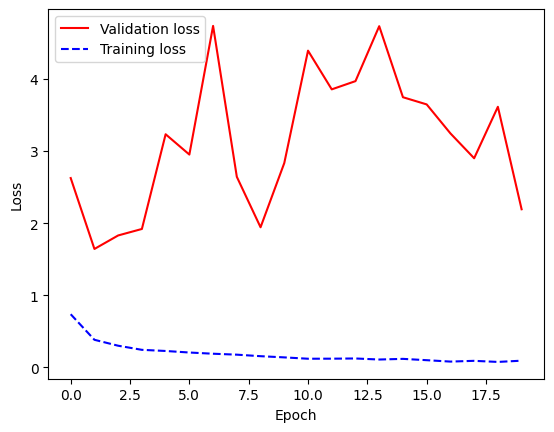

In [373]:
plt.plot(history.history['val_loss'],'r', label = 'Validation loss')
plt.plot(history.history['loss'],'--b',label = 'Training loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

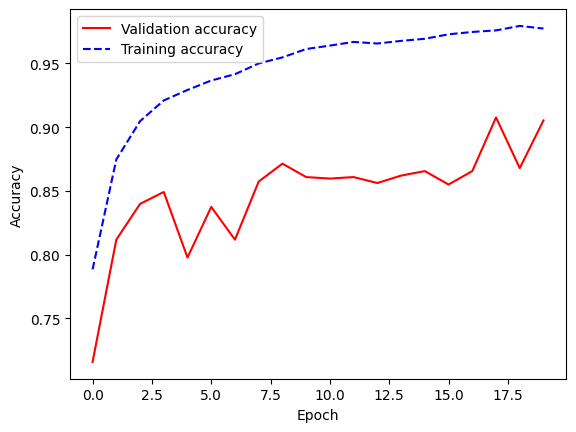

In [374]:
plt.plot(history.history['val_accuracy'],'r', label = 'Validation accuracy')
plt.plot(history.history['accuracy'],'--b',label = 'Training accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

## VGG19

In [306]:
basemodel = tf.keras.applications.VGG19(
    input_shape  = (150,150,3),
    include_top=False,
    weights='imagenet',
    classes=4)

80134624/80134624 [==============================] - 18s 0us/step


In [310]:
for layer in basemodel.layers[:-5]:
    print(layer.name)
    layer.trainable = False

input_70
block1_conv1
block1_conv2
block1_pool
block2_conv1
block2_conv2
block2_pool
block3_conv1
block3_conv2
block3_conv3
block3_conv4
block3_pool
block4_conv1
block4_conv2
block4_conv3
block4_conv4
block4_pool


In [311]:
basemodel.summary()

Model: "vgg19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_70 (InputLayer)       [(None, 150, 150, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 150, 150, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 150, 150, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 75, 75, 64)        0         
                                                                 
 block2_conv1 (Conv2D)       (None, 75, 75, 128)       73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 75, 75, 128)       147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 37, 37, 128)       0     

In [312]:
Inputs = tf.keras.Input(shape = (150,150,3))
Conv_base = basemodel(Inputs)
flatten = layers.Flatten()(Conv_base)
D1 = layers.Dense(128, activation= 'relu')(flatten)
D1 = layers.Dropout(0.4)(D1)
D2 = layers.Dense(128, activation= 'relu')(D1)
Output = layers.Dense(4, activation = 'softmax')(D2)
model = Model(Inputs, Output)


In [315]:
model.summary()

Model: "model_45"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_71 (InputLayer)       [(None, 150, 150, 3)]     0         
                                                                 
 vgg19 (Functional)          (None, 4, 4, 512)         20024384  
                                                                 
 flatten_52 (Flatten)        (None, 8192)              0         
                                                                 
 dense_118 (Dense)           (None, 128)               1048704   
                                                                 
 dropout_9 (Dropout)         (None, 128)               0         
                                                                 
 dense_119 (Dense)           (None, 128)               16512     
                                                                 
 dense_120 (Dense)           (None, 4)                 516

In [316]:
model.compile(loss="sparse_categorical_crossentropy",
optimizer="rmsprop",
metrics=["accuracy"])




import time
import keras.callbacks as callbacks
class TimeHistory(tf.keras.callbacks.Callback):
    def on_train_begin(self, logs={}):
        self.times = []

    def on_epoch_begin(self, batch, logs={}):
        self.epoch_time_start = time.time()

    def on_epoch_end(self, batch, logs={}):
        self.times.append(time.time() - self.epoch_time_start)
time_callback = TimeHistory()
early_stopping_cb = callbacks.EarlyStopping(patience = 10,restore_best_weights=True,verbose = 1, monitor ="val_accuracy")
checkpoint_cb = callbacks.ModelCheckpoint(r"G:\MSc project\VGG19.h5",save_best_only=True,verbose = 1)

In [317]:
history = model.fit(
train_gen,
epochs=20,
steps_per_epoch= 152,
validation_data=valid_gen,
validation_steps = 27 ,
callbacks = [checkpoint_cb,early_stopping_cb],verbose = 1)


Epoch 1/20
152/152 [==============================] - ETA: 0s - loss: 1.2797 - accuracy: 0.5090 
Epoch 1: val_loss improved from inf to 0.87141, saving model to G:\MSc project\VGG19.h5
152/152 [==============================] - 2143s 14s/step - loss: 1.2797 - accuracy: 0.5090 - val_loss: 0.8714 - val_accuracy: 0.5977
Epoch 2/20
152/152 [==============================] - ETA: 0s - loss: 0.6669 - accuracy: 0.7321 
Epoch 2: val_loss improved from 0.87141 to 0.85906, saving model to G:\MSc project\VGG19.h5
152/152 [==============================] - 2150s 14s/step - loss: 0.6669 - accuracy: 0.7321 - val_loss: 0.8591 - val_accuracy: 0.6199
Epoch 3/20
152/152 [==============================] - ETA: 0s - loss: 0.5086 - accuracy: 0.8225 
Epoch 3: val_loss did not improve from 0.85906
152/152 [==============================] - 2258s 15s/step - loss: 0.5086 - accuracy: 0.8225 - val_loss: 0.9848 - val_accuracy: 0.6526
Epoch 4/20
152/152 [==============================] - ETA: 0s - loss: 0.4165 - a

In [326]:
history.history.keys()

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])

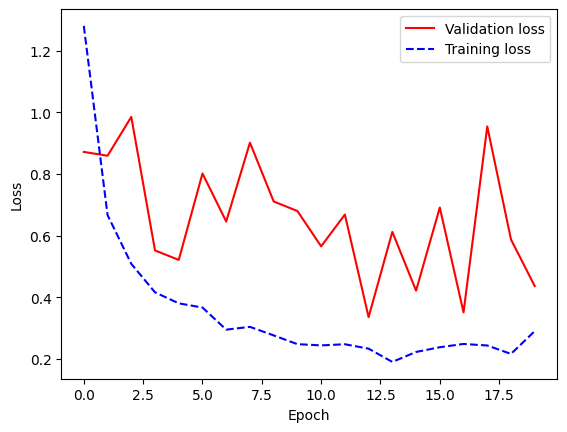

In [332]:
plt.plot(history.history['val_loss'],'r', label = 'Validation loss')
plt.plot(history.history['loss'],'--b',label = 'Training loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

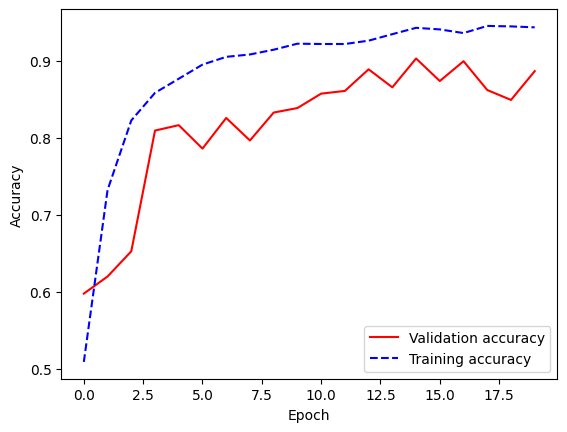

In [331]:
plt.plot(history.history['val_accuracy'],'r', label = 'Validation accuracy')
plt.plot(history.history['accuracy'],'--b',label = 'Training accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

In [337]:
model2 = tf.keras.models.load_model(r"G:\MSc project\VGG19.h5")
model2.evaluate(Test_gen)

41/41 [==============================] - 427s 10s/step - loss: 0.2972 - accuracy: 0.9001


[0.29717472195625305, 0.9000762701034546]

## VGG16

In [46]:
basemodel = tf.keras.applications.VGG16(
    input_shape  = (150,150,3),
    include_top=False,
    weights='imagenet',
    classes=4)

In [47]:
for layer in basemodel.layers[:-4]:
    print(layer.name)
    layer.trainable = False

input_12
block1_conv1
block1_conv2
block1_pool
block2_conv1
block2_conv2
block2_pool
block3_conv1
block3_conv2
block3_conv3
block3_pool
block4_conv1
block4_conv2
block4_conv3
block4_pool


In [48]:
basemodel.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_12 (InputLayer)       [(None, 150, 150, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 150, 150, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 150, 150, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 75, 75, 64)        0         
                                                                 
 block2_conv1 (Conv2D)       (None, 75, 75, 128)       73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 75, 75, 128)       147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 37, 37, 128)       0     

In [49]:
Inputs = tf.keras.Input(shape = (150,150,3))
Conv_base = basemodel(Inputs)
flatten = layers.Flatten()(Conv_base)
D1 = layers.Dense(128, activation= 'relu')(flatten)
D1 = layers.Dropout(0.4)(D1)
D2 = layers.Dense(128, activation= 'relu')(D1)
Output = layers.Dense(4, activation = 'softmax')(D2)
model = Model(Inputs, Output)


In [50]:
model.summary()

Model: "model_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_13 (InputLayer)       [(None, 150, 150, 3)]     0         
                                                                 
 vgg16 (Functional)          (None, 4, 4, 512)         14714688  
                                                                 
 flatten_6 (Flatten)         (None, 8192)              0         
                                                                 
 dense_18 (Dense)            (None, 128)               1048704   
                                                                 
 dropout_6 (Dropout)         (None, 128)               0         
                                                                 
 dense_19 (Dense)            (None, 128)               16512     
                                                                 
 dense_20 (Dense)            (None, 4)                 516 

In [51]:
model.compile(loss="sparse_categorical_crossentropy",
optimizer="rmsprop",
metrics=["accuracy"])




import time
import keras.callbacks as callbacks
class TimeHistory(tf.keras.callbacks.Callback):
    def on_train_begin(self, logs={}):
        self.times = []

    def on_epoch_begin(self, batch, logs={}):
        self.epoch_time_start = time.time()

    def on_epoch_end(self, batch, logs={}):
        self.times.append(time.time() - self.epoch_time_start)
time_callback = TimeHistory()
early_stopping_cb = callbacks.EarlyStopping(patience = 10,restore_best_weights=True,verbose = 1, monitor ="val_accuracy")
checkpoint_cb = callbacks.ModelCheckpoint(r"G:\MSc project\VGG16.h5",save_best_only=True,verbose = 1)

In [52]:
history = model.fit(
train_gen,
epochs=20,
steps_per_epoch= 152,
validation_data=valid_gen,
validation_steps = 27 ,
callbacks = [checkpoint_cb,early_stopping_cb],verbose = 1)


Epoch 1/20
152/152 [==============================] - ETA: 0s - loss: 1.3490 - accuracy: 0.4470
Epoch 1: val_loss improved from inf to 1.49069, saving model to G:\MSc project\VGG16.h5
152/152 [==============================] - 403s 3s/step - loss: 1.3490 - accuracy: 0.4470 - val_loss: 1.4907 - val_accuracy: 0.5614
Epoch 2/20
152/152 [==============================] - ETA: 0s - loss: 0.5718 - accuracy: 0.7953
Epoch 2: val_loss improved from 1.49069 to 0.69747, saving model to G:\MSc project\VGG16.h5
152/152 [==============================] - 415s 3s/step - loss: 0.5718 - accuracy: 0.7953 - val_loss: 0.6975 - val_accuracy: 0.7556
Epoch 3/20
152/152 [==============================] - ETA: 0s - loss: 0.4425 - accuracy: 0.8505
Epoch 3: val_loss improved from 0.69747 to 0.52858, saving model to G:\MSc project\VGG16.h5
152/152 [==============================] - 477s 3s/step - loss: 0.4425 - accuracy: 0.8505 - val_loss: 0.5286 - val_accuracy: 0.8175
Epoch 4/20
152/152 [========================

In [53]:
history.history.keys()

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])

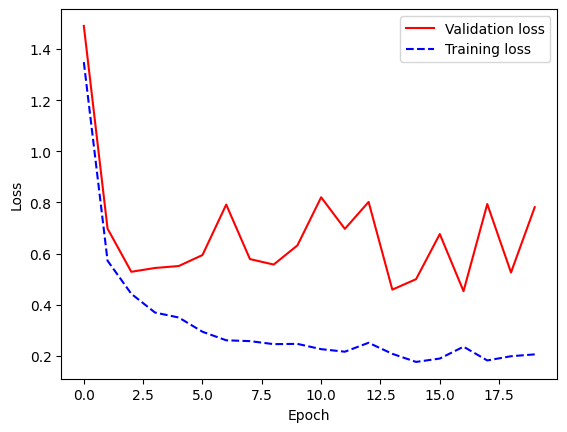

In [55]:
import matplotlib.pyplot as plt
plt.plot(history.history['val_loss'],'r', label = 'Validation loss')
plt.plot(history.history['loss'],'--b',label = 'Training loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

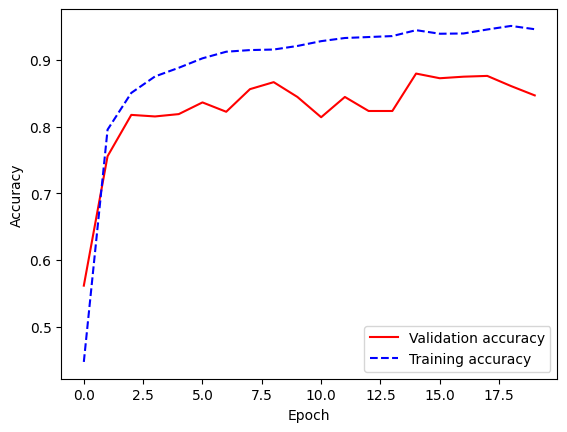

In [56]:
plt.plot(history.history['val_accuracy'],'r', label = 'Validation accuracy')
plt.plot(history.history['accuracy'],'--b',label = 'Training accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

In [58]:
model = tf.keras.models.load_model(r"G:\MSc project\VGG16.h5")
model.evaluate(Test_gen)

41/41 [==============================] - 71s 2s/step - loss: 0.2981 - accuracy: 0.8856


[0.2981013059616089, 0.8855835199356079]

## xception

In [17]:
from tensorflow.keras import layers
from tensorflow.keras import Model

In [3]:
basemodel = tf.keras.applications.Xception(
    input_shape  = (150,150,3),
    include_top=False,
    weights='imagenet',
    classes=4)

In [8]:
for layer in basemodel.layers[:-6]:
    print(layer.name)
    layer.trainable = False

input_1
block1_conv1
block1_conv1_bn
block1_conv1_act
block1_conv2
block1_conv2_bn
block1_conv2_act
block2_sepconv1
block2_sepconv1_bn
block2_sepconv2_act
block2_sepconv2
block2_sepconv2_bn
conv2d
block2_pool
batch_normalization
add
block3_sepconv1_act
block3_sepconv1
block3_sepconv1_bn
block3_sepconv2_act
block3_sepconv2
block3_sepconv2_bn
conv2d_1
block3_pool
batch_normalization_1
add_1
block4_sepconv1_act
block4_sepconv1
block4_sepconv1_bn
block4_sepconv2_act
block4_sepconv2
block4_sepconv2_bn
conv2d_2
block4_pool
batch_normalization_2
add_2
block5_sepconv1_act
block5_sepconv1
block5_sepconv1_bn
block5_sepconv2_act
block5_sepconv2
block5_sepconv2_bn
block5_sepconv3_act
block5_sepconv3
block5_sepconv3_bn
add_3
block6_sepconv1_act
block6_sepconv1
block6_sepconv1_bn
block6_sepconv2_act
block6_sepconv2
block6_sepconv2_bn
block6_sepconv3_act
block6_sepconv3
block6_sepconv3_bn
add_4
block7_sepconv1_act
block7_sepconv1
block7_sepconv1_bn
block7_sepconv2_act
block7_sepconv2
block7_sepconv2_

In [9]:
basemodel.summary()

Model: "xception"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 150, 150, 3  0           []                               
                                )]                                                                
                                                                                                  
 block1_conv1 (Conv2D)          (None, 74, 74, 32)   864         ['input_1[0][0]']                
                                                                                                  
 block1_conv1_bn (BatchNormaliz  (None, 74, 74, 32)  128         ['block1_conv1[0][0]']           
 ation)                                                                                           
                                                                                           

 n)                                                                                               
                                                                                                  
 block4_sepconv2 (SeparableConv  (None, 18, 18, 728)  536536     ['block4_sepconv2_act[0][0]']    
 2D)                                                                                              
                                                                                                  
 block4_sepconv2_bn (BatchNorma  (None, 18, 18, 728)  2912       ['block4_sepconv2[0][0]']        
 lization)                                                                                        
                                                                                                  
 conv2d_2 (Conv2D)              (None, 9, 9, 728)    186368      ['add_1[0][0]']                  
                                                                                                  
 block4_po

                                                                                                  
 block7_sepconv1_bn (BatchNorma  (None, 9, 9, 728)   2912        ['block7_sepconv1[0][0]']        
 lization)                                                                                        
                                                                                                  
 block7_sepconv2_act (Activatio  (None, 9, 9, 728)   0           ['block7_sepconv1_bn[0][0]']     
 n)                                                                                               
                                                                                                  
 block7_sepconv2 (SeparableConv  (None, 9, 9, 728)   536536      ['block7_sepconv2_act[0][0]']    
 2D)                                                                                              
                                                                                                  
 block7_se

                                                                  'add_6[0][0]']                  
                                                                                                  
 block10_sepconv1_act (Activati  (None, 9, 9, 728)   0           ['add_7[0][0]']                  
 on)                                                                                              
                                                                                                  
 block10_sepconv1 (SeparableCon  (None, 9, 9, 728)   536536      ['block10_sepconv1_act[0][0]']   
 v2D)                                                                                             
                                                                                                  
 block10_sepconv1_bn (BatchNorm  (None, 9, 9, 728)   2912        ['block10_sepconv1[0][0]']       
 alization)                                                                                       
          

 block12_sepconv3 (SeparableCon  (None, 9, 9, 728)   536536      ['block12_sepconv3_act[0][0]']   
 v2D)                                                                                             
                                                                                                  
 block12_sepconv3_bn (BatchNorm  (None, 9, 9, 728)   2912        ['block12_sepconv3[0][0]']       
 alization)                                                                                       
                                                                                                  
 add_10 (Add)                   (None, 9, 9, 728)    0           ['block12_sepconv3_bn[0][0]',    
                                                                  'add_9[0][0]']                  
                                                                                                  
 block13_sepconv1_act (Activati  (None, 9, 9, 728)   0           ['add_10[0][0]']                 
 on)      

In [18]:
Inputs = tf.keras.Input(shape = (150,150,3))
Conv_base = basemodel(Inputs)
flatten = layers.Flatten()(Conv_base)
D1 = layers.Dense(128, activation= 'relu')(flatten)
D1 = layers.Dropout(0.4)(D1)
D2 = layers.Dense(128, activation= 'relu')(D1)
Output = layers.Dense(4, activation = 'softmax')(D2)
model = Model(Inputs, Output)


In [19]:
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 150, 150, 3)]     0         
                                                                 
 xception (Functional)       (None, 5, 5, 2048)        20861480  
                                                                 
 flatten_1 (Flatten)         (None, 51200)             0         
                                                                 
 dense_3 (Dense)             (None, 128)               6553728   
                                                                 
 dropout_1 (Dropout)         (None, 128)               0         
                                                                 
 dense_4 (Dense)             (None, 128)               16512     
                                                                 
 dense_5 (Dense)             (None, 4)                 516   

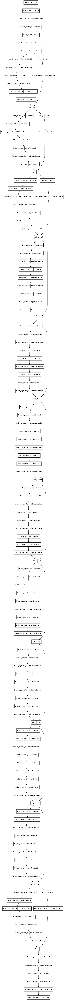

In [13]:
tf.keras.utils.plot_model(basemodel)

In [23]:
model.compile(loss="sparse_categorical_crossentropy",
optimizer="rmsprop",
metrics=["accuracy"])




import time
import keras.callbacks as callbacks
class TimeHistory(tf.keras.callbacks.Callback):
    def on_train_begin(self, logs={}):
        self.times = []

    def on_epoch_begin(self, batch, logs={}):
        self.epoch_time_start = time.time()

    def on_epoch_end(self, batch, logs={}):
        self.times.append(time.time() - self.epoch_time_start)
time_callback = TimeHistory()
early_stopping_cb = callbacks.EarlyStopping(patience = 10,restore_best_weights=True,verbose = 1, monitor ="val_accuracy")
checkpoint_cb = callbacks.ModelCheckpoint(r"G:\MSc project\Xception.h5",save_best_only=True,verbose = 1)

In [24]:
history = model.fit(
train_gen,
epochs=20,
steps_per_epoch= 152,
validation_data=valid_gen,
validation_steps = 27 ,
callbacks = [checkpoint_cb,early_stopping_cb],verbose = 1)


Epoch 1/20
152/152 [==============================] - ETA: 0s - loss: 0.7546 - accuracy: 0.8026
Epoch 1: val_loss improved from inf to 1.15944, saving model to G:\MSc project\Xception.h5
152/152 [==============================] - 223s 1s/step - loss: 0.7546 - accuracy: 0.8026 - val_loss: 1.1594 - val_accuracy: 0.7825
Epoch 2/20
152/152 [==============================] - ETA: 0s - loss: 0.3508 - accuracy: 0.8880
Epoch 2: val_loss did not improve from 1.15944
152/152 [==============================] - 213s 1s/step - loss: 0.3508 - accuracy: 0.8880 - val_loss: 1.2579 - val_accuracy: 0.6994
Epoch 3/20
152/152 [==============================] - ETA: 0s - loss: 0.3035 - accuracy: 0.9071
Epoch 3: val_loss improved from 1.15944 to 0.60609, saving model to G:\MSc project\Xception.h5
152/152 [==============================] - 237s 2s/step - loss: 0.3035 - accuracy: 0.9071 - val_loss: 0.6061 - val_accuracy: 0.8491
Epoch 4/20
152/152 [==============================] - ETA: 0s - loss: 0.2322 - accu

In [25]:
history.history.keys()

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])

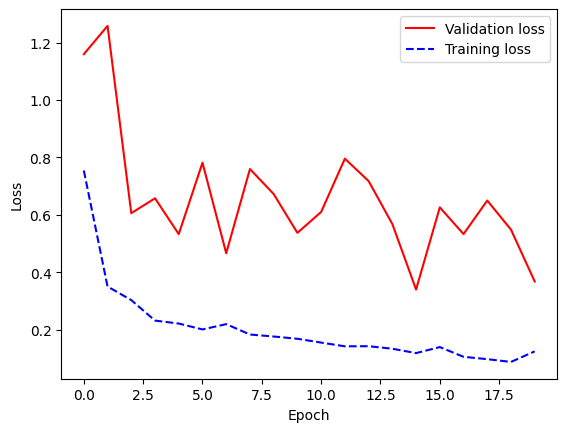

In [26]:
import matplotlib.pyplot as plt
plt.plot(history.history['val_loss'],'r', label = 'Validation loss')
plt.plot(history.history['loss'],'--b',label = 'Training loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

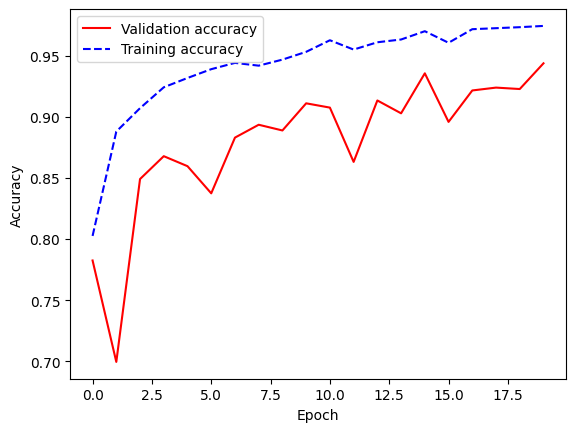

In [27]:
plt.plot(history.history['val_accuracy'],'r', label = 'Validation accuracy')
plt.plot(history.history['accuracy'],'--b',label = 'Training accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

In [28]:
model = tf.keras.models.load_model(r"G:\MSc project\Xception.h5")
model.evaluate(Test_gen)

41/41 [==============================] - 43s 1s/step - loss: 0.3383 - accuracy: 0.9222


[0.33832263946533203, 0.9221968054771423]

# Resnet

In [30]:
from tensorflow.keras import layers
from tensorflow.keras import Model

In [31]:
basemodel = tf.keras.applications. ResNet152V2(
    input_shape  = (150,150,3),
    include_top=False,
    weights='imagenet',
    classes=4)

234545216/234545216 [==============================] - 39s 0us/step


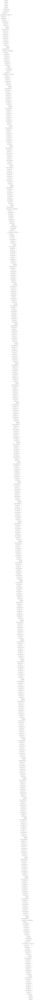

In [34]:
tf.keras.utils.plot_model(basemodel)

In [38]:
for layer in basemodel.layers[:-14]:
    print(layer.name)
    layer.trainable = False

input_5
conv1_pad
conv1_conv
pool1_pad
pool1_pool
conv2_block1_preact_bn
conv2_block1_preact_relu
conv2_block1_1_conv
conv2_block1_1_bn
conv2_block1_1_relu
conv2_block1_2_pad
conv2_block1_2_conv
conv2_block1_2_bn
conv2_block1_2_relu
conv2_block1_0_conv
conv2_block1_3_conv
conv2_block1_out
conv2_block2_preact_bn
conv2_block2_preact_relu
conv2_block2_1_conv
conv2_block2_1_bn
conv2_block2_1_relu
conv2_block2_2_pad
conv2_block2_2_conv
conv2_block2_2_bn
conv2_block2_2_relu
conv2_block2_3_conv
conv2_block2_out
conv2_block3_preact_bn
conv2_block3_preact_relu
conv2_block3_1_conv
conv2_block3_1_bn
conv2_block3_1_relu
conv2_block3_2_pad
conv2_block3_2_conv
conv2_block3_2_bn
conv2_block3_2_relu
max_pooling2d
conv2_block3_3_conv
conv2_block3_out
conv3_block1_preact_bn
conv3_block1_preact_relu
conv3_block1_1_conv
conv3_block1_1_bn
conv3_block1_1_relu
conv3_block1_2_pad
conv3_block1_2_conv
conv3_block1_2_bn
conv3_block1_2_relu
conv3_block1_0_conv
conv3_block1_3_conv
conv3_block1_out
conv3_block2_pre

In [39]:
basemodel.summary()

Model: "resnet152v2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_5 (InputLayer)           [(None, 150, 150, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 156, 156, 3)  0           ['input_5[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 75, 75, 64)   9472        ['conv1_pad[0][0]']              
                                                                                                  
 pool1_pad (ZeroPadding2D)      (None, 77, 77, 64)   0           ['conv1_conv[0][0]']   

 vation)                                                                                          
                                                                                                  
 conv2_block3_1_conv (Conv2D)   (None, 38, 38, 64)   16384       ['conv2_block3_preact_relu[0][0]'
                                                                 ]                                
                                                                                                  
 conv2_block3_1_bn (BatchNormal  (None, 38, 38, 64)  256         ['conv2_block3_1_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv2_block3_1_relu (Activatio  (None, 38, 38, 64)  0           ['conv2_block3_1_bn[0][0]']      
 n)                                                                                               
          

 conv3_block2_2_bn (BatchNormal  (None, 19, 19, 128)  512        ['conv3_block2_2_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv3_block2_2_relu (Activatio  (None, 19, 19, 128)  0          ['conv3_block2_2_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv3_block2_3_conv (Conv2D)   (None, 19, 19, 512)  66048       ['conv3_block2_2_relu[0][0]']    
                                                                                                  
 conv3_block2_out (Add)         (None, 19, 19, 512)  0           ['conv3_block1_out[0][0]',       
                                                                  'conv3_block2_3_conv[0][0]']    
          

 ization)                                                                                         
                                                                                                  
 conv3_block5_1_relu (Activatio  (None, 19, 19, 128)  0          ['conv3_block5_1_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv3_block5_2_pad (ZeroPaddin  (None, 21, 21, 128)  0          ['conv3_block5_1_relu[0][0]']    
 g2D)                                                                                             
                                                                                                  
 conv3_block5_2_conv (Conv2D)   (None, 19, 19, 128)  147456      ['conv3_block5_2_pad[0][0]']     
                                                                                                  
 conv3_blo

 conv3_block8_preact_bn (BatchN  (None, 19, 19, 512)  2048       ['conv3_block7_out[0][0]']       
 ormalization)                                                                                    
                                                                                                  
 conv3_block8_preact_relu (Acti  (None, 19, 19, 512)  0          ['conv3_block8_preact_bn[0][0]'] 
 vation)                                                                                          
                                                                                                  
 conv3_block8_1_conv (Conv2D)   (None, 19, 19, 128)  65536       ['conv3_block8_preact_relu[0][0]'
                                                                 ]                                
                                                                                                  
 conv3_block8_1_bn (BatchNormal  (None, 19, 19, 128)  512        ['conv3_block8_1_conv[0][0]']    
 ization) 

 conv4_block2_2_pad (ZeroPaddin  (None, 12, 12, 256)  0          ['conv4_block2_1_relu[0][0]']    
 g2D)                                                                                             
                                                                                                  
 conv4_block2_2_conv (Conv2D)   (None, 10, 10, 256)  589824      ['conv4_block2_2_pad[0][0]']     
                                                                                                  
 conv4_block2_2_bn (BatchNormal  (None, 10, 10, 256)  1024       ['conv4_block2_2_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv4_block2_2_relu (Activatio  (None, 10, 10, 256)  0          ['conv4_block2_2_bn[0][0]']      
 n)                                                                                               
          

                                                                                                  
 conv4_block5_preact_relu (Acti  (None, 10, 10, 1024  0          ['conv4_block5_preact_bn[0][0]'] 
 vation)                        )                                                                 
                                                                                                  
 conv4_block5_1_conv (Conv2D)   (None, 10, 10, 256)  262144      ['conv4_block5_preact_relu[0][0]'
                                                                 ]                                
                                                                                                  
 conv4_block5_1_bn (BatchNormal  (None, 10, 10, 256)  1024       ['conv4_block5_1_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv4_blo

 ization)                                                                                         
                                                                                                  
 conv4_block7_2_relu (Activatio  (None, 10, 10, 256)  0          ['conv4_block7_2_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv4_block7_3_conv (Conv2D)   (None, 10, 10, 1024  263168      ['conv4_block7_2_relu[0][0]']    
                                )                                                                 
                                                                                                  
 conv4_block7_out (Add)         (None, 10, 10, 1024  0           ['conv4_block6_out[0][0]',       
                                )                                 'conv4_block7_3_conv[0][0]']    
          

                                                                                                  
 conv4_block10_1_bn (BatchNorma  (None, 10, 10, 256)  1024       ['conv4_block10_1_conv[0][0]']   
 lization)                                                                                        
                                                                                                  
 conv4_block10_1_relu (Activati  (None, 10, 10, 256)  0          ['conv4_block10_1_bn[0][0]']     
 on)                                                                                              
                                                                                                  
 conv4_block10_2_pad (ZeroPaddi  (None, 12, 12, 256)  0          ['conv4_block10_1_relu[0][0]']   
 ng2D)                                                                                            
                                                                                                  
 conv4_blo

                                )                                                                 
                                                                                                  
 conv4_block12_out (Add)        (None, 10, 10, 1024  0           ['conv4_block11_out[0][0]',      
                                )                                 'conv4_block12_3_conv[0][0]']   
                                                                                                  
 conv4_block13_preact_bn (Batch  (None, 10, 10, 1024  4096       ['conv4_block12_out[0][0]']      
 Normalization)                 )                                                                 
                                                                                                  
 conv4_block13_preact_relu (Act  (None, 10, 10, 1024  0          ['conv4_block13_preact_bn[0][0]']
 ivation)                       )                                                                 
          

                                                                                                  
 conv4_block15_2_pad (ZeroPaddi  (None, 12, 12, 256)  0          ['conv4_block15_1_relu[0][0]']   
 ng2D)                                                                                            
                                                                                                  
 conv4_block15_2_conv (Conv2D)  (None, 10, 10, 256)  589824      ['conv4_block15_2_pad[0][0]']    
                                                                                                  
 conv4_block15_2_bn (BatchNorma  (None, 10, 10, 256)  1024       ['conv4_block15_2_conv[0][0]']   
 lization)                                                                                        
                                                                                                  
 conv4_block15_2_relu (Activati  (None, 10, 10, 256)  0          ['conv4_block15_2_bn[0][0]']     
 on)      

 Normalization)                 )                                                                 
                                                                                                  
 conv4_block18_preact_relu (Act  (None, 10, 10, 1024  0          ['conv4_block18_preact_bn[0][0]']
 ivation)                       )                                                                 
                                                                                                  
 conv4_block18_1_conv (Conv2D)  (None, 10, 10, 256)  262144      ['conv4_block18_preact_relu[0][0]
                                                                 ']                               
                                                                                                  
 conv4_block18_1_bn (BatchNorma  (None, 10, 10, 256)  1024       ['conv4_block18_1_conv[0][0]']   
 lization)                                                                                        
          

 conv4_block20_2_bn (BatchNorma  (None, 10, 10, 256)  1024       ['conv4_block20_2_conv[0][0]']   
 lization)                                                                                        
                                                                                                  
 conv4_block20_2_relu (Activati  (None, 10, 10, 256)  0          ['conv4_block20_2_bn[0][0]']     
 on)                                                                                              
                                                                                                  
 conv4_block20_3_conv (Conv2D)  (None, 10, 10, 1024  263168      ['conv4_block20_2_relu[0][0]']   
                                )                                                                 
                                                                                                  
 conv4_block20_out (Add)        (None, 10, 10, 1024  0           ['conv4_block19_out[0][0]',      
          

                                                                 ']                               
                                                                                                  
 conv4_block23_1_bn (BatchNorma  (None, 10, 10, 256)  1024       ['conv4_block23_1_conv[0][0]']   
 lization)                                                                                        
                                                                                                  
 conv4_block23_1_relu (Activati  (None, 10, 10, 256)  0          ['conv4_block23_1_bn[0][0]']     
 on)                                                                                              
                                                                                                  
 conv4_block23_2_pad (ZeroPaddi  (None, 12, 12, 256)  0          ['conv4_block23_1_relu[0][0]']   
 ng2D)                                                                                            
          

 conv4_block25_3_conv (Conv2D)  (None, 10, 10, 1024  263168      ['conv4_block25_2_relu[0][0]']   
                                )                                                                 
                                                                                                  
 conv4_block25_out (Add)        (None, 10, 10, 1024  0           ['conv4_block24_out[0][0]',      
                                )                                 'conv4_block25_3_conv[0][0]']   
                                                                                                  
 conv4_block26_preact_bn (Batch  (None, 10, 10, 1024  4096       ['conv4_block25_out[0][0]']      
 Normalization)                 )                                                                 
                                                                                                  
 conv4_block26_preact_relu (Act  (None, 10, 10, 1024  0          ['conv4_block26_preact_bn[0][0]']
 ivation) 

 on)                                                                                              
                                                                                                  
 conv4_block28_2_pad (ZeroPaddi  (None, 12, 12, 256)  0          ['conv4_block28_1_relu[0][0]']   
 ng2D)                                                                                            
                                                                                                  
 conv4_block28_2_conv (Conv2D)  (None, 10, 10, 256)  589824      ['conv4_block28_2_pad[0][0]']    
                                                                                                  
 conv4_block28_2_bn (BatchNorma  (None, 10, 10, 256)  1024       ['conv4_block28_2_conv[0][0]']   
 lization)                                                                                        
                                                                                                  
 conv4_blo

 conv4_block31_preact_bn (Batch  (None, 10, 10, 1024  4096       ['conv4_block30_out[0][0]']      
 Normalization)                 )                                                                 
                                                                                                  
 conv4_block31_preact_relu (Act  (None, 10, 10, 1024  0          ['conv4_block31_preact_bn[0][0]']
 ivation)                       )                                                                 
                                                                                                  
 conv4_block31_1_conv (Conv2D)  (None, 10, 10, 256)  262144      ['conv4_block31_preact_relu[0][0]
                                                                 ']                               
                                                                                                  
 conv4_block31_1_bn (BatchNorma  (None, 10, 10, 256)  1024       ['conv4_block31_1_conv[0][0]']   
 lization)

                                                                                                  
 conv4_block33_2_bn (BatchNorma  (None, 10, 10, 256)  1024       ['conv4_block33_2_conv[0][0]']   
 lization)                                                                                        
                                                                                                  
 conv4_block33_2_relu (Activati  (None, 10, 10, 256)  0          ['conv4_block33_2_bn[0][0]']     
 on)                                                                                              
                                                                                                  
 conv4_block33_3_conv (Conv2D)  (None, 10, 10, 1024  263168      ['conv4_block33_2_relu[0][0]']   
                                )                                                                 
                                                                                                  
 conv4_blo

 conv4_block36_1_conv (Conv2D)  (None, 10, 10, 256)  262144      ['conv4_block36_preact_relu[0][0]
                                                                 ']                               
                                                                                                  
 conv4_block36_1_bn (BatchNorma  (None, 10, 10, 256)  1024       ['conv4_block36_1_conv[0][0]']   
 lization)                                                                                        
                                                                                                  
 conv4_block36_1_relu (Activati  (None, 10, 10, 256)  0          ['conv4_block36_1_bn[0][0]']     
 on)                                                                                              
                                                                                                  
 conv4_block36_2_pad (ZeroPaddi  (None, 12, 12, 256)  0          ['conv4_block36_1_relu[0][0]']   
 ng2D)    

                                                                                                  
 conv5_block2_2_relu (Activatio  (None, 5, 5, 512)   0           ['conv5_block2_2_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv5_block2_3_conv (Conv2D)   (None, 5, 5, 2048)   1050624     ['conv5_block2_2_relu[0][0]']    
                                                                                                  
 conv5_block2_out (Add)         (None, 5, 5, 2048)   0           ['conv5_block1_out[0][0]',       
                                                                  'conv5_block2_3_conv[0][0]']    
                                                                                                  
 conv5_block3_preact_bn (BatchN  (None, 5, 5, 2048)  8192        ['conv5_block2_out[0][0]']       
 ormalizat

In [40]:
Inputs = tf.keras.Input(shape = (150,150,3))
Conv_base = basemodel(Inputs)
flatten = layers.Flatten()(Conv_base)
D1 = layers.Dense(128, activation= 'relu')(flatten)
D1 = layers.Dropout(0.4)(D1)
D2 = layers.Dense(128, activation= 'relu')(D1)
Output = layers.Dense(4, activation = 'softmax')(D2)
model = Model(Inputs, Output)


In [41]:
model.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_6 (InputLayer)        [(None, 150, 150, 3)]     0         
                                                                 
 resnet152v2 (Functional)    (None, 5, 5, 2048)        58331648  
                                                                 
 flatten_2 (Flatten)         (None, 51200)             0         
                                                                 
 dense_6 (Dense)             (None, 128)               6553728   
                                                                 
 dropout_2 (Dropout)         (None, 128)               0         
                                                                 
 dense_7 (Dense)             (None, 128)               16512     
                                                                 
 dense_8 (Dense)             (None, 4)                 516 

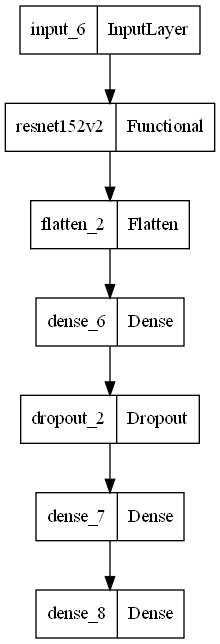

In [43]:
tf.keras.utils.plot_model(model)

In [44]:
model.compile(loss="sparse_categorical_crossentropy",
optimizer="rmsprop",
metrics=["accuracy"])




import time
import keras.callbacks as callbacks
class TimeHistory(tf.keras.callbacks.Callback):
    def on_train_begin(self, logs={}):
        self.times = []

    def on_epoch_begin(self, batch, logs={}):
        self.epoch_time_start = time.time()

    def on_epoch_end(self, batch, logs={}):
        self.times.append(time.time() - self.epoch_time_start)
time_callback = TimeHistory()
early_stopping_cb = callbacks.EarlyStopping(patience = 10,restore_best_weights=True,verbose = 1, monitor ="val_accuracy")
checkpoint_cb = callbacks.ModelCheckpoint(r"G:\MSc project\ResNet152V2.h5",save_best_only=True,verbose = 1)

In [45]:
history = model.fit(
train_gen,
epochs=20,
steps_per_epoch= 152,
validation_data=valid_gen,
validation_steps = 27 ,
callbacks = [checkpoint_cb,early_stopping_cb],verbose = 1)


Epoch 1/20
152/152 [==============================] - ETA: 0s - loss: 0.7164 - accuracy: 0.7828
Epoch 1: val_loss improved from inf to 3.89605, saving model to G:\MSc project\ResNet152V2.h5
152/152 [==============================] - 604s 4s/step - loss: 0.7164 - accuracy: 0.7828 - val_loss: 3.8961 - val_accuracy: 0.7076
Epoch 2/20
152/152 [==============================] - ETA: 0s - loss: 0.4180 - accuracy: 0.8771
Epoch 2: val_loss improved from 3.89605 to 1.46823, saving model to G:\MSc project\ResNet152V2.h5
152/152 [==============================] - 528s 3s/step - loss: 0.4180 - accuracy: 0.8771 - val_loss: 1.4682 - val_accuracy: 0.8082
Epoch 3/20
152/152 [==============================] - ETA: 0s - loss: 0.3165 - accuracy: 0.9082
Epoch 3: val_loss improved from 1.46823 to 1.00361, saving model to G:\MSc project\ResNet152V2.h5
152/152 [==============================] - 615s 4s/step - loss: 0.3165 - accuracy: 0.9082 - val_loss: 1.0036 - val_accuracy: 0.8433
Epoch 4/20
152/152 [======

In [46]:
history.history.keys()

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])

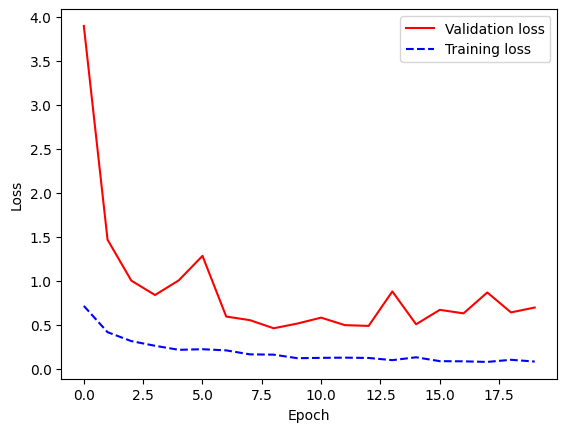

In [47]:
import matplotlib.pyplot as plt
plt.plot(history.history['val_loss'],'r', label = 'Validation loss')
plt.plot(history.history['loss'],'--b',label = 'Training loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

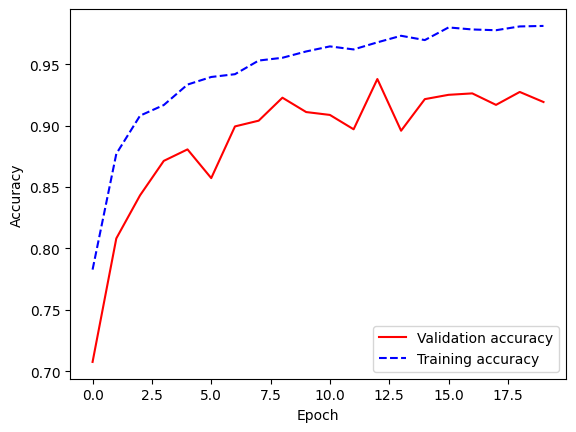

In [48]:
plt.plot(history.history['val_accuracy'],'r', label = 'Validation accuracy')
plt.plot(history.history['accuracy'],'--b',label = 'Training accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

In [49]:
model = tf.keras.models.load_model(r"G:\MSc project\ResNet152V2.h5")
model.evaluate(Test_gen)

41/41 [==============================] - 101s 2s/step - loss: 0.2884 - accuracy: 0.9382


[0.28840869665145874, 0.9382150769233704]

### InceptionResNetV2

In [4]:
from tensorflow.keras import layers
from tensorflow.keras import Model



In [5]:
basemodel = tf.keras.applications.InceptionResNetV2(
    input_shape  = (150,150,3),
    include_top=False,
    weights='imagenet',
    classes=4)

219055592/219055592 [==============================] - 36s 0us/step


In [10]:
tf.keras.utils.plot_model(basemodel,  'G:\inc.png')

In [17]:
for layer in basemodel.layers[:-21]:
    print(layer.name)
    layer.trainable = False

input_1
conv2d
batch_normalization
activation
conv2d_1
batch_normalization_1
activation_1
conv2d_2
batch_normalization_2
activation_2
max_pooling2d
conv2d_3
batch_normalization_3
activation_3
conv2d_4
batch_normalization_4
activation_4
max_pooling2d_1
conv2d_8
batch_normalization_8
activation_8
conv2d_6
conv2d_9
batch_normalization_6
batch_normalization_9
activation_6
activation_9
average_pooling2d
conv2d_5
conv2d_7
conv2d_10
conv2d_11
batch_normalization_5
batch_normalization_7
batch_normalization_10
batch_normalization_11
activation_5
activation_7
activation_10
activation_11
mixed_5b
conv2d_15
batch_normalization_15
activation_15
conv2d_13
conv2d_16
batch_normalization_13
batch_normalization_16
activation_13
activation_16
conv2d_12
conv2d_14
conv2d_17
batch_normalization_12
batch_normalization_14
batch_normalization_17
activation_12
activation_14
activation_17
block35_1_mixed
block35_1_conv
block35_1
block35_1_ac
conv2d_21
batch_normalization_21
activation_21
conv2d_19
conv2d_22
batc

In [18]:
basemodel.summary()

Model: "inception_resnet_v2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 150, 150, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 74, 74, 32)   864         ['input_1[0][0]']                
                                                                                                  
 batch_normalization (BatchNorm  (None, 74, 74, 32)  96          ['conv2d[0][0]']                 
 alization)                                                                                       
                                                                                

 batch_normalization_10 (BatchN  (None, 16, 16, 96)  288         ['conv2d_10[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 batch_normalization_11 (BatchN  (None, 16, 16, 64)  192         ['conv2d_11[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 activation_5 (Activation)      (None, 16, 16, 96)   0           ['batch_normalization_5[0][0]']  
                                                                                                  
 activation_7 (Activation)      (None, 16, 16, 64)   0           ['batch_normalization_7[0][0]']  
                                                                                                  
 activatio

 batch_normalization_19 (BatchN  (None, 16, 16, 32)  96          ['conv2d_19[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 batch_normalization_22 (BatchN  (None, 16, 16, 48)  144         ['conv2d_22[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 activation_19 (Activation)     (None, 16, 16, 32)   0           ['batch_normalization_19[0][0]'] 
                                                                                                  
 activation_22 (Activation)     (None, 16, 16, 48)   0           ['batch_normalization_22[0][0]'] 
                                                                                                  
 conv2d_18

                                                                                                  
 block35_3_mixed (Concatenate)  (None, 16, 16, 128)  0           ['activation_24[0][0]',          
                                                                  'activation_26[0][0]',          
                                                                  'activation_29[0][0]']          
                                                                                                  
 block35_3_conv (Conv2D)        (None, 16, 16, 320)  41280       ['block35_3_mixed[0][0]']        
                                                                                                  
 block35_3 (Lambda)             (None, 16, 16, 320)  0           ['block35_2_ac[0][0]',           
                                                                  'block35_3_conv[0][0]']         
                                                                                                  
 block35_3

                                                                                                  
 activation_40 (Activation)     (None, 16, 16, 48)   0           ['batch_normalization_40[0][0]'] 
                                                                                                  
 conv2d_36 (Conv2D)             (None, 16, 16, 32)   10240       ['block35_4_ac[0][0]']           
                                                                                                  
 conv2d_38 (Conv2D)             (None, 16, 16, 32)   9216        ['activation_37[0][0]']          
                                                                                                  
 conv2d_41 (Conv2D)             (None, 16, 16, 64)   27648       ['activation_40[0][0]']          
                                                                                                  
 batch_normalization_36 (BatchN  (None, 16, 16, 32)  96          ['conv2d_36[0][0]']              
 ormalizat

 block35_6 (Lambda)             (None, 16, 16, 320)  0           ['block35_5_ac[0][0]',           
                                                                  'block35_6_conv[0][0]']         
                                                                                                  
 block35_6_ac (Activation)      (None, 16, 16, 320)  0           ['block35_6[0][0]']              
                                                                                                  
 conv2d_51 (Conv2D)             (None, 16, 16, 32)   10240       ['block35_6_ac[0][0]']           
                                                                                                  
 batch_normalization_51 (BatchN  (None, 16, 16, 32)  96          ['conv2d_51[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 activatio

 conv2d_59 (Conv2D)             (None, 16, 16, 64)   27648       ['activation_58[0][0]']          
                                                                                                  
 batch_normalization_54 (BatchN  (None, 16, 16, 32)  96          ['conv2d_54[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 batch_normalization_56 (BatchN  (None, 16, 16, 32)  96          ['conv2d_56[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 batch_normalization_59 (BatchN  (None, 16, 16, 64)  192         ['conv2d_59[0][0]']              
 ormalization)                                                                                    
          

 batch_normalization_69 (BatchN  (None, 16, 16, 32)  96          ['conv2d_69[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 activation_69 (Activation)     (None, 16, 16, 32)   0           ['batch_normalization_69[0][0]'] 
                                                                                                  
 conv2d_67 (Conv2D)             (None, 16, 16, 32)   10240       ['block35_9_ac[0][0]']           
                                                                                                  
 conv2d_70 (Conv2D)             (None, 16, 16, 48)   13824       ['activation_69[0][0]']          
                                                                                                  
 batch_normalization_67 (BatchN  (None, 16, 16, 32)  96          ['conv2d_67[0][0]']              
 ormalizat

                                                                  'max_pooling2d_2[0][0]']        
                                                                                                  
 conv2d_77 (Conv2D)             (None, 7, 7, 128)    139264      ['mixed_6a[0][0]']               
                                                                                                  
 batch_normalization_77 (BatchN  (None, 7, 7, 128)   384         ['conv2d_77[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 activation_77 (Activation)     (None, 7, 7, 128)    0           ['batch_normalization_77[0][0]'] 
                                                                                                  
 conv2d_78 (Conv2D)             (None, 7, 7, 160)    143360      ['activation_77[0][0]']          
          

 activation_85 (Activation)     (None, 7, 7, 128)    0           ['batch_normalization_85[0][0]'] 
                                                                                                  
 conv2d_86 (Conv2D)             (None, 7, 7, 160)    143360      ['activation_85[0][0]']          
                                                                                                  
 batch_normalization_86 (BatchN  (None, 7, 7, 160)   480         ['conv2d_86[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 activation_86 (Activation)     (None, 7, 7, 160)    0           ['batch_normalization_86[0][0]'] 
                                                                                                  
 conv2d_84 (Conv2D)             (None, 7, 7, 192)    208896      ['block17_2_ac[0][0]']           
          

 activation_94 (Activation)     (None, 7, 7, 160)    0           ['batch_normalization_94[0][0]'] 
                                                                                                  
 conv2d_92 (Conv2D)             (None, 7, 7, 192)    208896      ['block17_4_ac[0][0]']           
                                                                                                  
 conv2d_95 (Conv2D)             (None, 7, 7, 192)    215040      ['activation_94[0][0]']          
                                                                                                  
 batch_normalization_92 (BatchN  (None, 7, 7, 192)   576         ['conv2d_92[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 batch_normalization_95 (BatchN  (None, 7, 7, 192)   576         ['conv2d_95[0][0]']              
 ormalizat

 Normalization)                                                                                   
                                                                                                  
 batch_normalization_103 (Batch  (None, 7, 7, 192)   576         ['conv2d_103[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 activation_100 (Activation)    (None, 7, 7, 192)    0           ['batch_normalization_100[0][0]']
                                                                                                  
 activation_103 (Activation)    (None, 7, 7, 192)    0           ['batch_normalization_103[0][0]']
                                                                                                  
 block17_7_mixed (Concatenate)  (None, 7, 7, 384)    0           ['activation_100[0][0]',         
          

 activation_111 (Activation)    (None, 7, 7, 192)    0           ['batch_normalization_111[0][0]']
                                                                                                  
 block17_9_mixed (Concatenate)  (None, 7, 7, 384)    0           ['activation_108[0][0]',         
                                                                  'activation_111[0][0]']         
                                                                                                  
 block17_9_conv (Conv2D)        (None, 7, 7, 1088)   418880      ['block17_9_mixed[0][0]']        
                                                                                                  
 block17_9 (Lambda)             (None, 7, 7, 1088)   0           ['block17_8_ac[0][0]',           
                                                                  'block17_9_conv[0][0]']         
                                                                                                  
 block17_9

 block17_11 (Lambda)            (None, 7, 7, 1088)   0           ['block17_10_ac[0][0]',          
                                                                  'block17_11_conv[0][0]']        
                                                                                                  
 block17_11_ac (Activation)     (None, 7, 7, 1088)   0           ['block17_11[0][0]']             
                                                                                                  
 conv2d_121 (Conv2D)            (None, 7, 7, 128)    139264      ['block17_11_ac[0][0]']          
                                                                                                  
 batch_normalization_121 (Batch  (None, 7, 7, 128)   384         ['conv2d_121[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 activatio

 batch_normalization_129 (Batch  (None, 7, 7, 128)   384         ['conv2d_129[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 activation_129 (Activation)    (None, 7, 7, 128)    0           ['batch_normalization_129[0][0]']
                                                                                                  
 conv2d_130 (Conv2D)            (None, 7, 7, 160)    143360      ['activation_129[0][0]']         
                                                                                                  
 batch_normalization_130 (Batch  (None, 7, 7, 160)   480         ['conv2d_130[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 activatio

 batch_normalization_138 (Batch  (None, 7, 7, 160)   480         ['conv2d_138[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 activation_138 (Activation)    (None, 7, 7, 160)    0           ['batch_normalization_138[0][0]']
                                                                                                  
 conv2d_136 (Conv2D)            (None, 7, 7, 192)    208896      ['block17_15_ac[0][0]']          
                                                                                                  
 conv2d_139 (Conv2D)            (None, 7, 7, 192)    215040      ['activation_138[0][0]']         
                                                                                                  
 batch_normalization_136 (Batch  (None, 7, 7, 192)   576         ['conv2d_136[0][0]']             
 Normaliza

 conv2d_147 (Conv2D)            (None, 7, 7, 192)    215040      ['activation_146[0][0]']         
                                                                                                  
 batch_normalization_144 (Batch  (None, 7, 7, 192)   576         ['conv2d_144[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 batch_normalization_147 (Batch  (None, 7, 7, 192)   576         ['conv2d_147[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 activation_144 (Activation)    (None, 7, 7, 192)    0           ['batch_normalization_144[0][0]']
                                                                                                  
 activatio

                                                                                                  
 activation_152 (Activation)    (None, 7, 7, 192)    0           ['batch_normalization_152[0][0]']
                                                                                                  
 activation_155 (Activation)    (None, 7, 7, 192)    0           ['batch_normalization_155[0][0]']
                                                                                                  
 block17_20_mixed (Concatenate)  (None, 7, 7, 384)   0           ['activation_152[0][0]',         
                                                                  'activation_155[0][0]']         
                                                                                                  
 block17_20_conv (Conv2D)       (None, 7, 7, 1088)   418880      ['block17_20_mixed[0][0]']       
                                                                                                  
 block17_2

 activation_165 (Activation)    (None, 3, 3, 224)    0           ['batch_normalization_165[0][0]']
                                                                                                  
 conv2d_163 (Conv2D)            (None, 3, 3, 192)    399360      ['mixed_7a[0][0]']               
                                                                                                  
 conv2d_166 (Conv2D)            (None, 3, 3, 256)    172032      ['activation_165[0][0]']         
                                                                                                  
 batch_normalization_163 (Batch  (None, 3, 3, 192)   576         ['conv2d_163[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 batch_normalization_166 (Batch  (None, 3, 3, 256)   768         ['conv2d_166[0][0]']             
 Normaliza

 Normalization)                                                                                   
                                                                                                  
 batch_normalization_174 (Batch  (None, 3, 3, 256)   768         ['conv2d_174[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 activation_171 (Activation)    (None, 3, 3, 192)    0           ['batch_normalization_171[0][0]']
                                                                                                  
 activation_174 (Activation)    (None, 3, 3, 256)    0           ['batch_normalization_174[0][0]']
                                                                                                  
 block8_3_mixed (Concatenate)   (None, 3, 3, 448)    0           ['activation_171[0][0]',         
          

 activation_182 (Activation)    (None, 3, 3, 256)    0           ['batch_normalization_182[0][0]']
                                                                                                  
 block8_5_mixed (Concatenate)   (None, 3, 3, 448)    0           ['activation_179[0][0]',         
                                                                  'activation_182[0][0]']         
                                                                                                  
 block8_5_conv (Conv2D)         (None, 3, 3, 2080)   933920      ['block8_5_mixed[0][0]']         
                                                                                                  
 block8_5 (Lambda)              (None, 3, 3, 2080)   0           ['block8_4_ac[0][0]',            
                                                                  'block8_5_conv[0][0]']          
                                                                                                  
 block8_5_

 block8_7 (Lambda)              (None, 3, 3, 2080)   0           ['block8_6_ac[0][0]',            
                                                                  'block8_7_conv[0][0]']          
                                                                                                  
 block8_7_ac (Activation)       (None, 3, 3, 2080)   0           ['block8_7[0][0]']               
                                                                                                  
 conv2d_192 (Conv2D)            (None, 3, 3, 192)    399360      ['block8_7_ac[0][0]']            
                                                                                                  
 batch_normalization_192 (Batch  (None, 3, 3, 192)   576         ['conv2d_192[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 activatio

 batch_normalization_200 (Batch  (None, 3, 3, 192)   576         ['conv2d_200[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 activation_200 (Activation)    (None, 3, 3, 192)    0           ['batch_normalization_200[0][0]']
                                                                                                  
 conv2d_201 (Conv2D)            (None, 3, 3, 224)    129024      ['activation_200[0][0]']         
                                                                                                  
 batch_normalization_201 (Batch  (None, 3, 3, 224)   672         ['conv2d_201[0][0]']             
 Normalization)                                                                                   
                                                                                                  
 activatio

In [19]:
Inputs = tf.keras.Input(shape = (150,150,3))
Conv_base = basemodel(Inputs)
flatten = layers.Flatten()(Conv_base)
D1 = layers.Dense(128, activation= 'relu')(flatten)
D1 = layers.Dropout(0.4)(D1)
D2 = layers.Dense(128, activation= 'relu')(D1)
Output = layers.Dense(4, activation = 'softmax')(D2)
model = Model(Inputs, Output)


In [20]:
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 150, 150, 3)]     0         
                                                                 
 inception_resnet_v2 (Functi  (None, 3, 3, 1536)       54336736  
 onal)                                                           
                                                                 
 flatten (Flatten)           (None, 13824)             0         
                                                                 
 dense (Dense)               (None, 128)               1769600   
                                                                 
 dropout (Dropout)           (None, 128)               0         
                                                                 
 dense_1 (Dense)             (None, 128)               16512     
                                                             

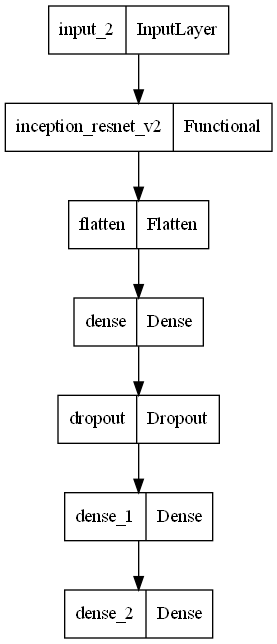

In [21]:
tf.keras.utils.plot_model(model)

In [22]:
model.compile(loss="sparse_categorical_crossentropy",
optimizer="rmsprop",
metrics=["accuracy"])




import time
import keras.callbacks as callbacks
class TimeHistory(tf.keras.callbacks.Callback):
    def on_train_begin(self, logs={}):
        self.times = []

    def on_epoch_begin(self, batch, logs={}):
        self.epoch_time_start = time.time()

    def on_epoch_end(self, batch, logs={}):
        self.times.append(time.time() - self.epoch_time_start)
time_callback = TimeHistory()
early_stopping_cb = callbacks.EarlyStopping(patience = 10,restore_best_weights=True,verbose = 1, monitor ="val_accuracy")
checkpoint_cb = callbacks.ModelCheckpoint(r"G:\MSc project\InceptionResNet.h5",save_best_only=True,verbose = 1)

In [23]:
history = model.fit(
train_gen,
epochs=20,
steps_per_epoch= 152,
validation_data=valid_gen,
validation_steps = 27 ,
callbacks = [checkpoint_cb,early_stopping_cb],verbose = 1)


Epoch 1/20
152/152 [==============================] - ETA: 0s - loss: 1.0264 - accuracy: 0.7597
Epoch 1: val_loss improved from inf to 25.07929, saving model to G:\MSc project\InceptionResNet.h5
152/152 [==============================] - 282s 2s/step - loss: 1.0264 - accuracy: 0.7597 - val_loss: 25.0793 - val_accuracy: 0.4854
Epoch 2/20
152/152 [==============================] - ETA: 0s - loss: 0.4086 - accuracy: 0.8796
Epoch 2: val_loss improved from 25.07929 to 1.78842, saving model to G:\MSc project\InceptionResNet.h5
152/152 [==============================] - 236s 2s/step - loss: 0.4086 - accuracy: 0.8796 - val_loss: 1.7884 - val_accuracy: 0.7439
Epoch 3/20
152/152 [==============================] - ETA: 0s - loss: 0.3399 - accuracy: 0.8936
Epoch 3: val_loss improved from 1.78842 to 0.83158, saving model to G:\MSc project\InceptionResNet.h5
152/152 [==============================] - 245s 2s/step - loss: 0.3399 - accuracy: 0.8936 - val_loss: 0.8316 - val_accuracy: 0.7977
Epoch 4/20


In [24]:
history.history.keys()

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])

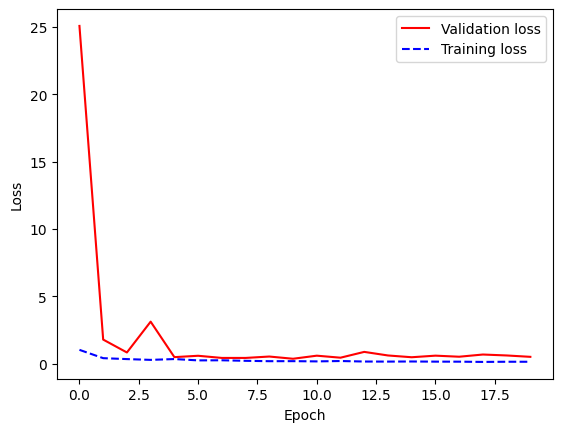

In [25]:
import matplotlib.pyplot as plt
plt.plot(history.history['val_loss'],'r', label = 'Validation loss')
plt.plot(history.history['loss'],'--b',label = 'Training loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

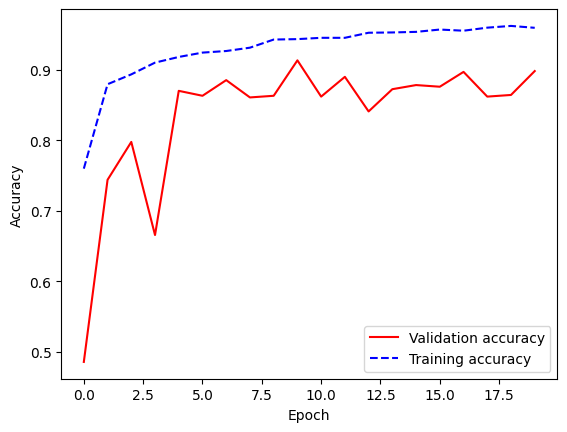

In [26]:
plt.plot(history.history['val_accuracy'],'r', label = 'Validation accuracy')
plt.plot(history.history['accuracy'],'--b',label = 'Training accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

In [28]:
model = tf.keras.models.load_model(r"G:\MSc project\InceptionResNet.h5")
model.evaluate(Test_gen)

41/41 [==============================] - 50s 1s/step - loss: 0.3198 - accuracy: 0.9222


[0.3197825253009796, 0.9221968054771423]

## Maze arch

In [55]:
from tensorflow.keras import layers
inputs = tf.keras.Input(shape = (150,150,3))
x1 = layers.MultiHeadAttention(key_dim= 64, num_heads=32, dropout=0.3)(inputs, inputs)
x1 = layers.Dropout(0.2)(x1)
x1 = layers.Dense(32, activation = 'relu')(x1)

x2 = layers.MultiHeadAttention(key_dim= 64, num_heads=32, dropout=0.3)(inputs, inputs)
x2 = layers.Dropout(0.2)(x2)
x2 = layers.Dense(32, activation = 'relu')(x2)


x3 = layers.MultiHeadAttention(key_dim= 64, num_heads=32, dropout=0.3)(inputs, inputs)
x3 = layers.Dropout(0.2)(x3)
x3 = layers.Dense(32, activation = 'relu')(x3)

x = tf.keras.layers.Add()([x1,x2,x3])

x = tf.keras.layers.Dense(64, activation = 'relu')(x)
x = tf.keras.layers.Dropout(0.2)(x)
output = tf.keras.layers.Dense(4,activation = 'softmax')(x)

maze = tf.keras.Model(inputs, output)



In [65]:
from tensorflow.keras import layers
inputs = tf.keras.Input(shape = (150,150,3))
x1 = layers.MultiHeadAttention(key_dim= 64, num_heads=32, dropout=0.3)(inputs, inputs)
x1 = layers.Dropout(0.2)(x1)
x1 = inputs+x1
x1 = layers.Dense(32, activation = 'relu')(x1)
x1 = layers.Dropout(0.4)(x1)
x1 = layers.Dense(32, activation = 'relu')(x1)
x1 = layers.GlobalAveragePooling2D()(x1)
x1 = layers.Flatten()(x1)
x = tf.keras.layers.Dense(64, activation = 'relu')(x1)
x = tf.keras.layers.Dropout(0.2)(x)
output = tf.keras.layers.Dense(4,activation = 'softmax')(x)

maze = tf.keras.Model(inputs, output)



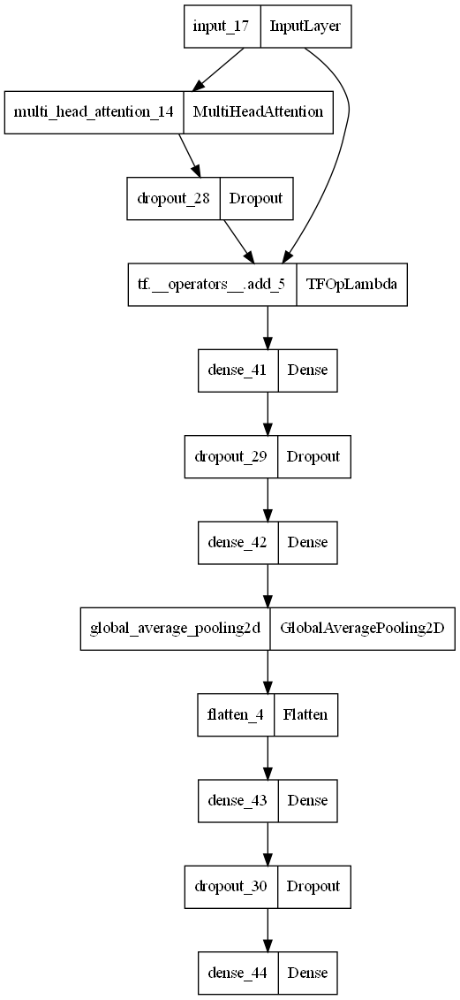

In [66]:
tf.keras.utils.plot_model(maze)

In [67]:
maze.summary()

Model: "model_9"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_17 (InputLayer)          [(None, 150, 150, 3  0           []                               
                                )]                                                                
                                                                                                  
 multi_head_attention_14 (Multi  (None, 150, 150, 3)  30723      ['input_17[0][0]',               
 HeadAttention)                                                   'input_17[0][0]']               
                                                                                                  
 dropout_28 (Dropout)           (None, 150, 150, 3)  0           ['multi_head_attention_14[0][0]']
                                                                                            

In [69]:
maze.compile(loss="sparse_categorical_crossentropy",
optimizer="rmsprop",
metrics=["accuracy"])




import time
import keras.callbacks as callbacks
class TimeHistory(tf.keras.callbacks.Callback):
    def on_train_begin(self, logs={}):
        self.times = []

    def on_epoch_begin(self, batch, logs={}):
        self.epoch_time_start = time.time()

    def on_epoch_end(self, batch, logs={}):
        self.times.append(time.time() - self.epoch_time_start)
time_callback = TimeHistory()
early_stopping_cb = callbacks.EarlyStopping(patience = 10,restore_best_weights=True,verbose = 1, monitor ="val_accuracy")
checkpoint_cb = callbacks.ModelCheckpoint(r"G:\MSc project\Mazeqq.h5",save_best_only=True,verbose = 1)

In [ ]:
history = maze.fit(
train_gen,
epochs=20,
steps_per_epoch= 152,
validation_data=valid_gen,
validation_steps = 27 ,
callbacks = [checkpoint_cb,early_stopping_cb],verbose = 1)


Epoch 1/20
